### Assignment Notes

Image processing: scale thresholding, applying filters, transformations, and
segmentation.

 - Is the response variable unbalanced?
   - yes! talk about outliers
 - What is the distribution of each of the features?
   - shown on graphs
   - *use `qcut` to visualize low/medium/high feature distributions*
 - Are there features are correlated with a particular response value?
   - add plots
 - Are there collinear features in the data?
   - discussed with correlation heatmap
 - Are there outliers?
   - discussed with histograms/distributions
 - What are the seasonal or linear trends? 
   - TBD
---
 - ~~Histograms or Distribution plots~~
 - Scatter plots or Bi-plots (PCA decomp)
 - Pearson correlation coefficients heat map
 - Box plots
 - Line plots 


**Rubric**
 - in repo as notebook, well chosen dataset, data-supported decision making
   - outliers, missing values, duplicates
 - every feature is investigates using numerical/visual means
 - statistical relationship strengths analyzed, correlation coefficients

**Kaggle Links**
 - [on R2 scoring with outlier values](https://www.kaggle.com/competitions/planttraits2024/discussion/481303)
 - [target outlier - do images make sense?](https://www.kaggle.com/code/richolson/extreme-seed-mass-and-heights-a-clue)
   - find original notebook I stole plot_images function from
   - [PlantNet](https://identify.plantnet.org/) species identification tool (from image)
 - [EDA notebook](https://www.kaggle.com/code/thejas2002/planttraits-eda)
   - use for seasonal graphs, polar plots
 - [tricky images discussion](https://www.kaggle.com/competitions/planttraits2024/discussion/493236)
   - simply use as a reference
 
---
**My Notebooks**
 - [pycaret, geodata, no sequential regression](https://www.kaggle.com/code/ndfgsdfg/planttraits-pycaret/edit)
   - contains "results" dataset
 - [geodata working copy](https://www.kaggle.com/code/ndfgsdfg/planttraits-geodata/edit) *(scroll through notebook for experiment details)*
   - updated sklearn package for latest models (1.4.1)
   - tried using simple DNN vs...
     - ElasticNet, kNN (60), CatBoost, XGBoost, LGBM, Huber
       - ElasticNet, kNN did not need to be wrapped in multioutput regressor
       - tested various kNN neighbor counts (5,15,30,45,60,90)
     - RegressorChain vs Multioutput
       - chain order in descending single target performance: 4,26,50,18,11,3112
       - `[0,3,4,2,1,5]`
   - tried PCA with 16, 33, 49 features
   - tried selectKbest features, select from model (Recursive feature elimination)
   - had trouble transfering/using sklearn `TransformedTargetRegressor` with Keras sequential model
     - need to backwards transform model predictions for scoring?
     - SciKeras possible alternative
   - defining new evaluation metric should be helpful
 - [images only working copy](https://www.kaggle.com/code/ndfgsdfg/planttraits-images-only)
 - **[submission notebook](https://www.kaggle.com/code/ndfgsdfg/planttraits-working)**
   - feature scaling, target transformation with MobileNet
     - standard scaling and PCA decomposition (49)
       - 49 determined from previous experiments
     - box-cox target transformation most helpful
       - quartile similarly close
       - both better than log
     - image resize tensorflow layer more helpful than downsampling during dataset generation
       - default parameters better than other trials
   - transfer learning model comparison
     - MobileNet best performance and fastest training
     - InceptionResNet next best performance and slowest training
     - Inception, Xception, EfficientNet (all variations) not worth it
   - full retrain vs frozen model transfer (ImageNet)
     - slightly better results, no time difference with full retrain

## Start
 - data provided from [Kaggle competition](https://www.kaggle.com/competitions/planttraits2024/data)
   - *dataset will not be uploaded to the project repository*
 - only training data used for this project
   - tabular data (CSV) converted to parquet format
   - images are 512x512x3 PNG files
- *Spoiler Alerts* - findings from my work in this competition
  - plant trait values in training dataset contain incorrect, extreme values
  - models should not be trained with these values
  - error metrics can be influenced by these extremes if not properly cleaned
    - outlier robust metrics and models (ex: **Huber** [loss](https://en.wikipedia.org/wiki/Huber_loss) and [Regressor](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.HuberRegressor.html#sklearn.linear_model.HuberRegressor)) tend to perform better with raw, uncleaned data.
   
---
- 55,489 images, index by `id` with 175 features
- feature groups
  - `WORLDCLIM_<>_<>`, climate features based on coordinates
    - temperature, precipitation
    - one engineered feature, as per [paper methods](https://www.nature.com/articles/s41598-021-95616-0#Sec8): `delta_precipitation_of_wettest_and_dryest_month`
  - `SOIL_<>_<>`, various soil measurements at multiple depths 
  - `MODIS_<>_<>`, sun/reflectance measurements (satellite)
  - `VOD_<>_<>`, various other measurements (radar)

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

# from sklearn import show_versions
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.linear_model import ElasticNet
from scipy import stats

from pathlib import Path

folder = Path('planttraits2024')

train_raw = pd.read_parquet(Path(folder, 'train.parquet'))
test = pd.read_parquet(Path(folder, 'test0c.parquet'))

targets = train_raw.columns[~train_raw.columns.isin(test.columns)]
print('Target Traits\n', targets)
targets = targets[targets.str.endswith('mean')]
features = train_raw.columns[train_raw.columns.isin(test.columns)]

Target Traits
 Index(['X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean',
       'X4_sd', 'X11_sd', 'X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd'],
      dtype='object')


#### Seasonality???
 [kaggle tutorial](https://www.kaggle.com/code/ryanholbrook/seasonality#kln-83)
 - satellite features `f_groups['SATELLITE']`
   - 5 different bands over 12 months
     - 2,5 related. 1,3,4 related
 - radar features `f_groups['RADAR']`
   - 3 different bands (C, Ku, X) over 12 months
     - different multiyear mean ranges shouldn't matter?
 - calculation
   - see Climate feature exploration for temperature and precipitation seasonality
     - based on Coefficient of Variation [wiki](https://en.wikipedia.org/wiki/Coefficient_of_variation)

In [100]:
train_raw[f_groups['CLIM']].T

id,192027691,195542235,196639184,195728812,195251545,195733955,193133748,195910523,194078966,194019169,...,143375475,196738049,193145264,170161513,194246645,190558785,194523231,195888987,135487319,146608105
WORLDCLIM_BIO1_annual_mean_temperature,12.235703,17.270555,14.254504,18.680834,0.673204,12.062123,0.271833,13.004167,16.890060,-0.267778,...,25.342134,8.818889,15.907291,7.772279,10.237585,19.472172,13.724150,14.741204,16.094763,24.559971
WORLDCLIM_BIO12_annual_precipitation,374.466675,90.239998,902.071411,1473.933350,530.088867,1982.033325,768.048889,1026.000000,316.833344,601.566650,...,1269.821411,912.524414,1166.500000,842.102051,746.724487,244.795914,1450.000000,581.866638,1180.838135,1748.857178
WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,62.524445,10.351111,49.642857,163.100006,50.857777,320.138092,50.986668,53.000000,12.071428,70.533333,...,273.744904,36.311111,184.500000,43.357143,38.000000,39.127552,162.260208,109.231110,80.176193,272.821442
WORLDCLIM_BIO15_precipitation_seasonality,72.256844,38.220940,17.873655,45.009758,38.230709,74.343796,27.305773,14.918256,14.717559,49.502716,...,104.328812,16.471970,72.396286,20.809752,17.433586,67.074493,43.139324,89.272148,22.909716,51.363777
WORLDCLIM_BIO4_temperature_seasonality,773.592041,859.193298,387.977753,381.053986,1323.526855,318.258270,1299.451904,379.825012,522.941895,1179.570190,...,91.052284,955.260071,280.652466,688.702271,499.778442,472.710358,652.716858,507.273010,342.184021,73.158348
WORLDCLIM_BIO7_temperature_annual_range,33.277779,40.009777,22.807142,20.436666,45.891998,17.557619,49.694664,20.049999,27.007143,42.730000,...,14.505612,34.401337,20.049999,26.403061,26.671429,27.758673,26.694387,26.874668,17.346189,13.400000


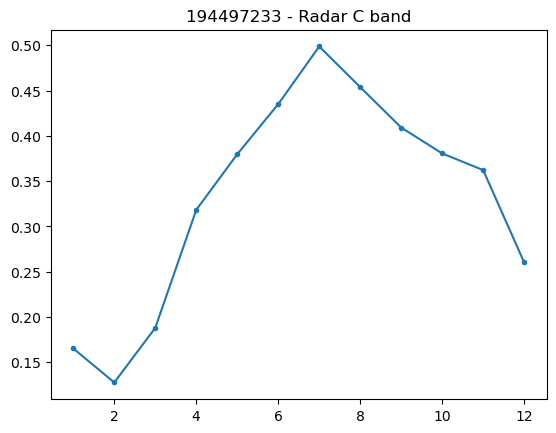

In [98]:
samp = train_raw.sample(1)
samp = samp[f_groups['RADAR']]
samp = samp[samp.columns[samp.columns.str.find('_X_')>0]]
samp = samp.T
samp.set_index(np.arange(12)+1, inplace=True)
plt.plot(samp, '.-')
plt.title(f"{samp.columns[0]} - Radar C band")
plt.show()

In [101]:
samp

id,194497233
1,0.165128
2,0.127518
3,0.187814
4,0.318166
5,0.379673
6,0.435012
7,0.498726
8,0.453859
9,0.409179
10,0.380574


In [126]:
stats.variation(samp, ddof=1)

array([0.36446986])

In [424]:
def fourier_features(index, freq, order):
    time = np.arange(len(index), dtype=np.float32)
    k = 2 * np.pi * (1 / freq) * time
    features = {}
    for i in range(1, order + 1):
        features.update({
            f"sin_{freq}_{i}": np.sin(i * k),
            f"cos_{freq}_{i}": np.cos(i * k),
        })
    return pd.DataFrame(features, index=index)

In [425]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [426]:
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax

### Feature Exploration
 - ***NEW IDEA***
   - soil, clim good. but for radar and satellite:
   - make `f_group` selection multicolumn index, then add month + freq band
 - decomposition notes
   - can satellite and radar measurements be reduced to annual mean, delta max-min, and seasonality?
     - like precipitation and temperature in CLIM features
     - does seasonality incorporate peak month?
   - see SOIL, CLIM sections for specifics. [PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#sklearn.decomposition.PCA)
   - [sklearn guide](https://scikit-learn.org/stable/modules/unsupervised_reduction.html), see feature agglomeration
 - features relation to target plant traits will not be explored until after data cleaning methods have been proposed (*see Spoilers*)

*enable scrolling for following cell output*

In [5]:
for f in features:
    print(f)
    if f 

WORLDCLIM_BIO1_annual_mean_temperature
WORLDCLIM_BIO12_annual_precipitation
WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month
WORLDCLIM_BIO15_precipitation_seasonality
WORLDCLIM_BIO4_temperature_seasonality
WORLDCLIM_BIO7_temperature_annual_range
SOIL_bdod_0.5cm_mean_0.01_deg
SOIL_bdod_100.200cm_mean_0.01_deg
SOIL_bdod_15.30cm_mean_0.01_deg
SOIL_bdod_30.60cm_mean_0.01_deg
SOIL_bdod_5.15cm_mean_0.01_deg
SOIL_bdod_60.100cm_mean_0.01_deg
SOIL_cec_0.5cm_mean_0.01_deg
SOIL_cec_100.200cm_mean_0.01_deg
SOIL_cec_15.30cm_mean_0.01_deg
SOIL_cec_30.60cm_mean_0.01_deg
SOIL_cec_5.15cm_mean_0.01_deg
SOIL_cec_60.100cm_mean_0.01_deg
SOIL_cfvo_0.5cm_mean_0.01_deg
SOIL_cfvo_100.200cm_mean_0.01_deg
SOIL_cfvo_15.30cm_mean_0.01_deg
SOIL_cfvo_30.60cm_mean_0.01_deg
SOIL_cfvo_5.15cm_mean_0.01_deg
SOIL_cfvo_60.100cm_mean_0.01_deg
SOIL_clay_0.5cm_mean_0.01_deg
SOIL_clay_100.200cm_mean_0.01_deg
SOIL_clay_15.30cm_mean_0.01_deg
SOIL_clay_30.60cm_mean_0.01_deg
SOIL_clay_5.15cm_mean_0.01_deg
SOIL

In [6]:
f_groups = {}
f_groups['CLIM'] = features[features.str.startswith('WORLDCLIM')]
f_groups['SOIL'] = features[features.str.startswith('SOIL_')]
f_groups['SATELLITE'] = features[features.str.startswith('MODIS_')]
f_groups['RADAR'] = features[features.str.startswith('VOD_')]

#### RADAR Features
 - 3 frequency bands over different time ranges (multiyear), mean for each month --> 36 features
   - C, Ku, X
   - basic references
     - [satellite frequency bands](https://lotusarise.com/satellite-frequency-bands-upsc/), [microwave table](https://www.everythingrf.com/tech-resources/frequency-bands)
 - features strongly correlated with each other, show consistent relationships with month
 - 

In [161]:
f_groups['RADAR'][::6]

Index(['VOD_C_2002_2018_multiyear_mean_m01',
       'VOD_C_2002_2018_multiyear_mean_m07',
       'VOD_Ku_1987_2017_multiyear_mean_m01',
       'VOD_Ku_1987_2017_multiyear_mean_m07',
       'VOD_X_1997_2018_multiyear_mean_m01',
       'VOD_X_1997_2018_multiyear_mean_m07'],
      dtype='object')

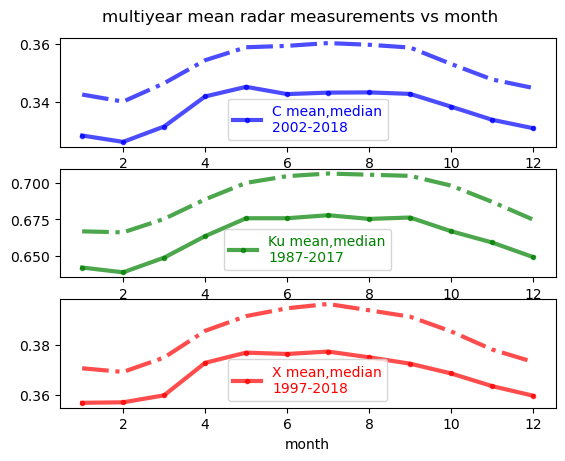

In [306]:
colors = ['b','g','r']
for i,meas in enumerate(['C', 'Ku', 'X']):
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sub = train_raw[cols]
    ax = plt.subplot(3,1,i+1,)
    ax.plot(np.arange(1,13), sub.T.median(axis=1), '.-',
            label=f"{meas} mean,median\n{'-'.join(cols[0].split('_')[2:4])}", 
            alpha=0.7, linewidth=3, color=colors[i])
    ax.plot(np.arange(1,13), sub.T.mean(axis=1), '-.',
            alpha=0.7, linewidth=3, color=colors[i])
    ax.legend(labelcolor='linecolor')
plt.xlabel('month')
plt.suptitle('multiyear mean radar measurements vs month', y=0.94)
plt.show()

In [200]:
corr = pd.DataFrame(index=train_raw.index)
for meas in ['C', 'Ku', 'X']:
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sub = train_raw[cols]
    corr.loc[sub.index, meas] = sub.sum(axis=1)

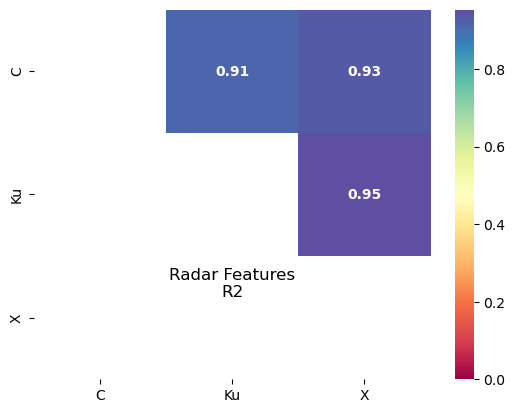

In [219]:
sns.heatmap(corr.corr()**2, mask=np.tril(corr.corr()),
            cmap='Spectral', annot=True, vmin=0,
            annot_kws={'fontweight':'bold'},
           )
plt.title('Radar Features\nR2', y=0.2)
plt.show()

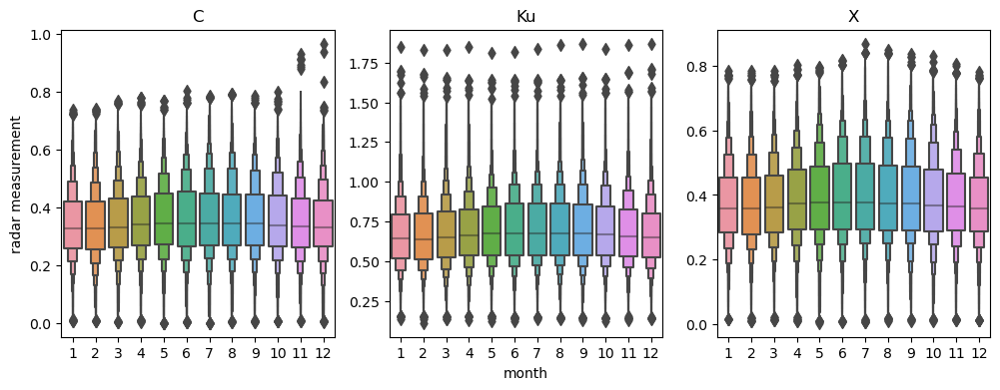

In [324]:
plt.figure(figsize=(12,4))
for i,meas in enumerate(['C', 'Ku', 'X']):
    ax = plt.subplot(1,3,i+1)
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sns.boxenplot(train_raw[cols], ax=ax)
    locs = ax.get_xticks()
    ax.set_xticks(locs, [str(i+1) for i in range(12)])
    ax.set_title(meas)
    if i == 1:
        ax.set_xlabel('month')
    elif i == 0:
        ax.set_ylabel('radar measurement')
plt.show()

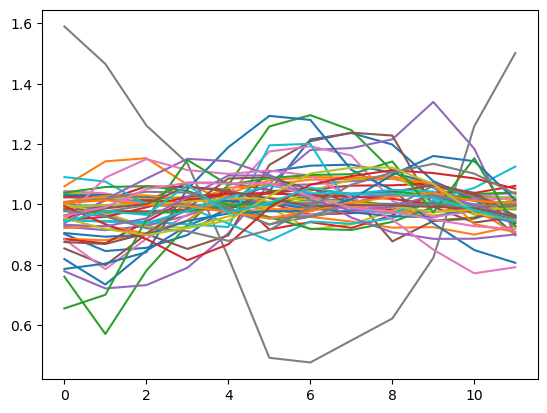

In [405]:
sub = train_raw.sample(50)[cols]
for ind in sub.index:
    plt.plot(np.arange(12), sub.loc[ind,:]/sub.loc[ind,:].mean())

---
**Seasonality Investigation**
 - fit 3rd order polynomial?

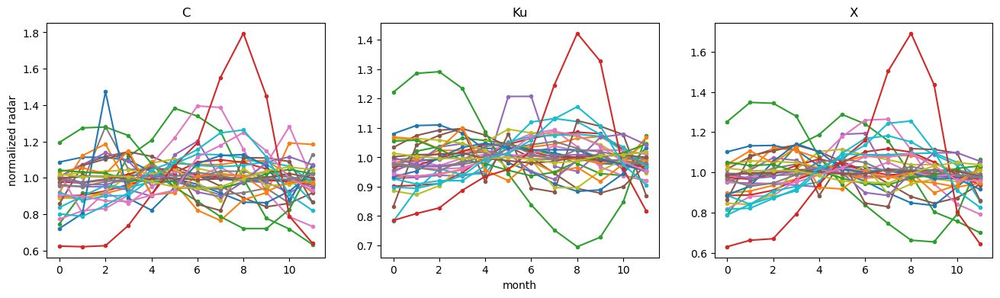

In [5]:
plt.figure(figsize=(16,4))
samp = train_raw.sample(30)
for i,meas in enumerate(['C', 'Ku', 'X']):
    ax = plt.subplot(1,3,i+1)
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sub = samp[cols]
    for ind in sub.index:
        ax.plot(np.arange(12), sub.loc[ind,:]/sub.loc[ind,:].mean(), '.-')    
    
    ax.set_title(meas)
    if i == 1:
        ax.set_xlabel('month')
    elif i == 0:
        ax.set_ylabel('normalized radar')
plt.show()

'8.6e-04|-1.6e-02|5.8e-02|1.0e+00'

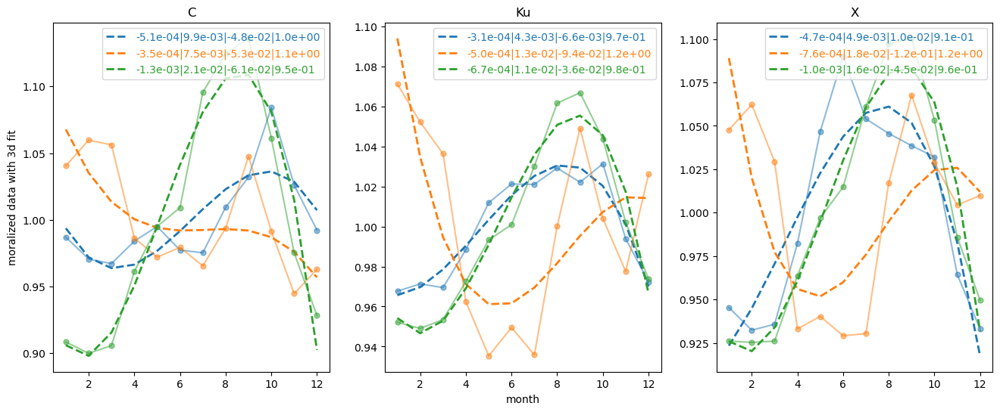

In [137]:
x = np.arange(12)+1

plt.figure(figsize=(16,6))
samp = train_raw.sample(3)
for i,meas in enumerate(['C', 'Ku', 'X']):
    ax = plt.subplot(1,3,i+1)
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sub = samp[cols]    
    for ind in sub.index:
        s = ax.plot(x, sub.loc[ind,:]/sub.loc[ind,:].mean(),
                     '.-', markersize=10, alpha=0.5)
        poly = np.polyfit(x, sub.loc[ind,:]/sub.loc[ind,:].mean(), 
                          3,  full=True)
        ax.plot(x, np.poly1d(poly[0])(x), '--', linewidth=2, 
                 color=s[0].get_color(), label='|'.join([f'{val:.1e}' for val in poly[0]]))
        
    ax.set_title(meas)
    ax.legend(labelcolor='linecolor')
    if i == 1:
        ax.set_xlabel('month')
    elif i == 0:
        ax.set_ylabel('moralized data with 3d fit')
plt.show()

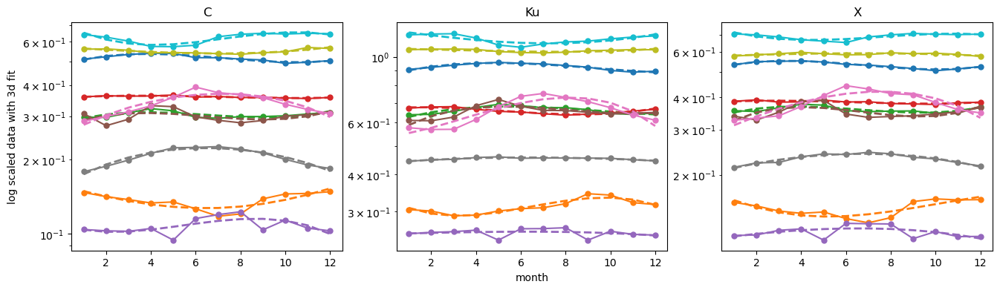

In [59]:
x = np.arange(12)+1

plt.figure(figsize=(16,4))
samp = train_raw.sample(30)
for i,meas in enumerate(['C', 'Ku', 'X']):
    ax = plt.subplot(1,3,i+1)
    cols = f_groups['RADAR'][[f[1]==meas for f in f_groups['RADAR'].str.split('_')]]
    sub = samp[cols]    
    for ind in sub.index[::3]:
        s = ax.plot(x, sub.loc[ind,:],
                     '.-', markersize=10)
        poly = np.polyfit(x, sub.loc[ind,:], 
                          3,  full=True)
        ax.plot(x, np.poly1d(poly[0])(x), '--', linewidth=2, 
                 color=s[0].get_color())
        
    ax.set_title(meas)
    ax.set_yscale('log')
    if i == 1:
        ax.set_xlabel('month')
    elif i == 0:
        ax.set_ylabel('log scaled data with 3d fit')
plt.show()

---

In [418]:
pca = PCA(n_components=6)
pca.fit(StandardScaler().fit_transform(train_raw[f_groups['CLIM']]))

PCA(n_components=6)

#### Satelitte Features
 - 5 different reflectancs bands for 12 different months --> 60 features
 - bands 2,5 and bands 1,2,4 seem to be related
   - latter show prominent dip in the middle of the year
 - refer to [NASA MODIS](https://modis.gsfc.nasa.gov/data/dataprod/Rrs.php)
   - moderate resolution imaging spectroradiometer

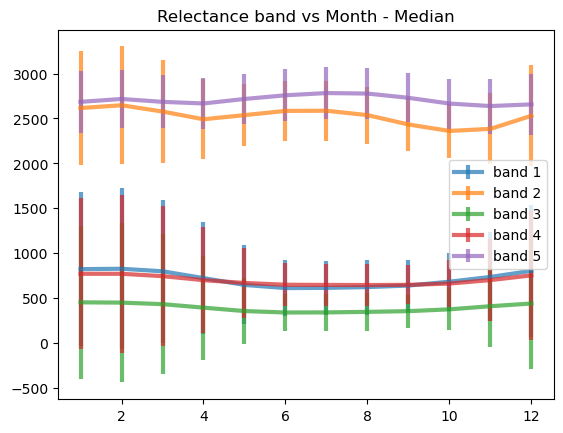

In [115]:
for i in range(5):
    cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str.find(f'band_0{i+1}')>0]
    sort_cols = [cols[0]]
    sort_cols.extend(cols[4:])
    sort_cols.extend(cols[1:4])
    sub = train_raw[sort_cols]
    plt.errorbar(x=np.arange(1,13), y=sub.T.median(axis=1), yerr=sub.T.std(axis=1)/2,
                 label=f'band {i+1}', alpha=0.7, linewidth=3)
plt.legend()
plt.title('Reflectance vs Month - median for each band')
plt.show()

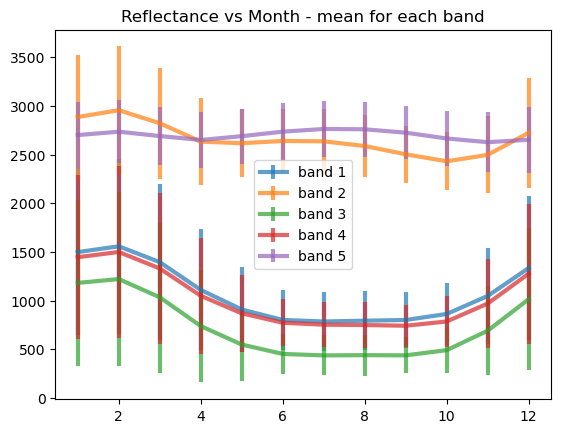

In [118]:
for i in range(5):
    cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str.find(f'band_0{i+1}')>0]
    sort_cols = [cols[0]]
    sort_cols.extend(cols[4:])
    sort_cols.extend(cols[1:4])
    sub = train_raw[sort_cols]
    plt.errorbar(x=np.arange(1,13), y=sub.T.mean(axis=1), yerr=sub.T.std(axis=1)/2,
                 label=f'band {i+1}', alpha=0.7, linewidth=3)
plt.legend()
plt.title('Reflectance vs Month - mean for each band')
#plt.yscale('log')
plt.show()

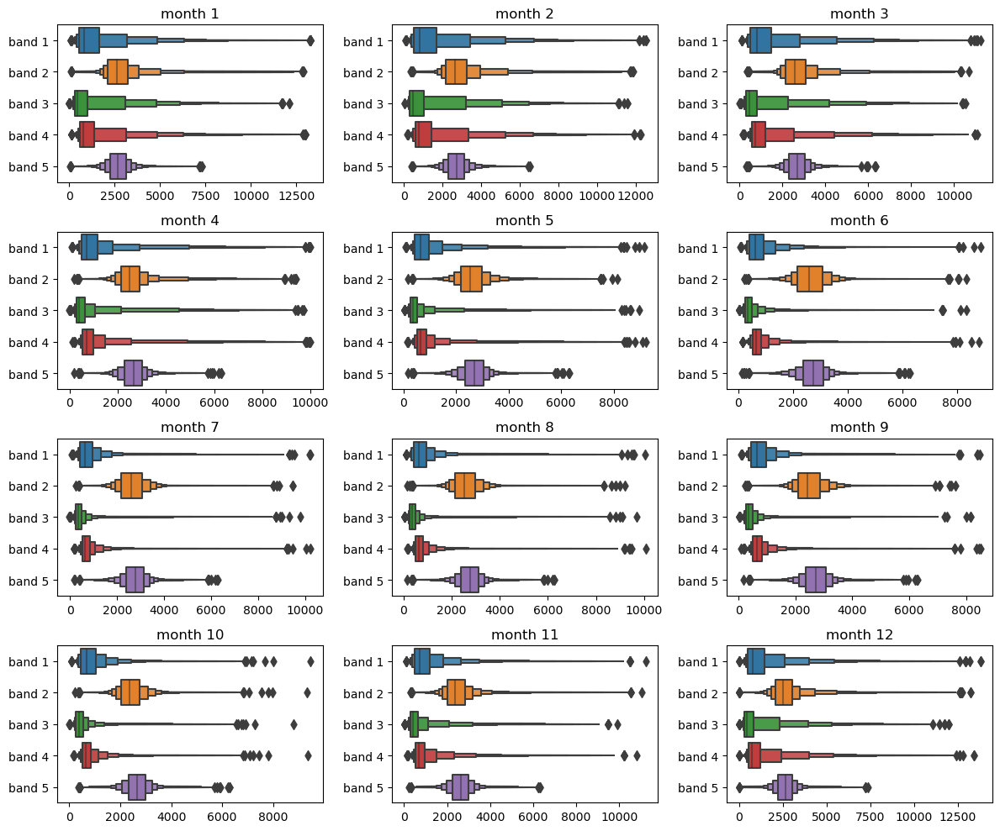

In [155]:
plt.figure(figsize=(12,10), tight_layout=True)
for i in range(12):
    if i<9:
        cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str[-2:] == f'm{i+1}']
    else:
        cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str[-2:] == f'{i+1}']
    sub = train_raw[cols]
    
    ax = plt.subplot(4,3,i+1,)
    sns.boxenplot(sub, orient='h', ax=ax)
    t = ax.get_yticks()
    ax.set_yticks(ticks=t, labels=[f'band {B+1}' for B in range(5)])
    ax.set_title(f'month {i+1}')
plt.show()

---
**Seasonality??**

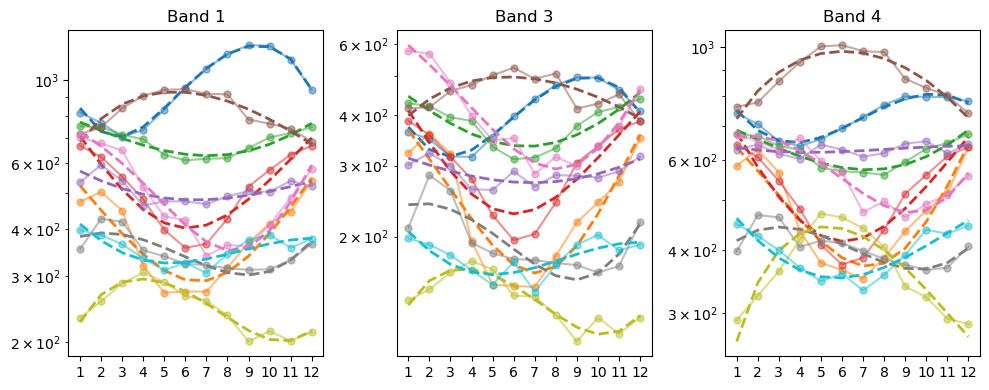

In [54]:
plt.figure(figsize=(10,4), tight_layout=True)
samp = train_raw.sample(10)
k=1
x = np.arange(12)+1
for i in [1,3,4]:   
    cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str.find(f'band_0{i}')>0]
    sort_cols = [cols[0]]
    sort_cols.extend(cols[4:])
    sort_cols.extend(cols[1:4])
    sub = samp[sort_cols]
    ax = plt.subplot(1,3,k,)
    
    for ind in sub.index:
        s=ax.plot(x, sub.loc[ind,:],
                  '.-', markersize=10, alpha=0.5)
        poly = np.polyfit(x, sub.loc[ind,:], 
                          3,  full=True)
        ax.plot(x, np.poly1d(poly[0])(x), '--', linewidth=2, 
                color=s[0].get_color())
    ax.set_xticks(x,x)
    ax.set_title(f'Band {i}')
    ax.set_yscale('log')
    k+=1
plt.show()

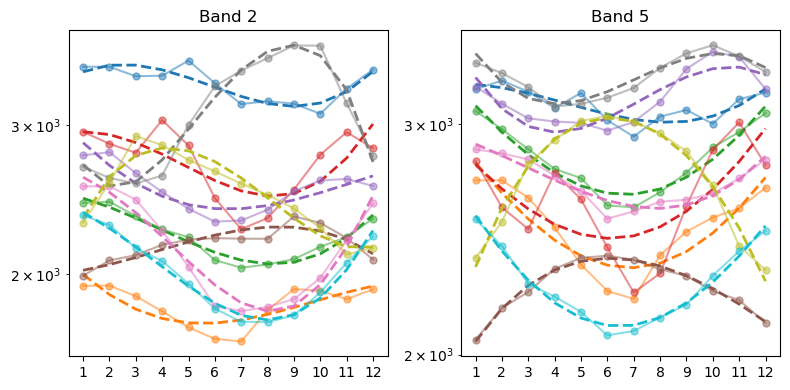

In [53]:
plt.figure(figsize=(8,4), tight_layout=True)
samp = train_raw.sample(10)
k=1
x = np.arange(12)+1
for i in [2,5]:
    
    cols = f_groups['SATELLITE'][f_groups['SATELLITE'].str.find(f'band_0{i}')>0]
    sort_cols = [cols[0]]
    sort_cols.extend(cols[4:])
    sort_cols.extend(cols[1:4])
    sub = samp[sort_cols]
    ax = plt.subplot(1,2,k,)
    
    for ind in sub.index:
        s=ax.plot(x, sub.loc[ind,:],
                  '.-', markersize=10, alpha=0.5)
        poly = np.polyfit(x, sub.loc[ind,:], 
                          3,  full=True)
        ax.plot(x, np.poly1d(poly[0])(x), '--', linewidth=2, 
                color=s[0].get_color())
    ax.set_xticks(x,x)
    ax.set_title(f'Band {i}')
    ax.set_yscale('log')
    k+=1
plt.show()


In [24]:
sub

,VOD_X_1997_2018_multiyear_mean_m01,VOD_X_1997_2018_multiyear_mean_m02,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
id,,,,,,,,,,,,
195629033,0.310698,0.309213,0.307793,0.313545,0.311676,0.311971,0.310821,0.314297,0.313078,0.309044,0.310713,0.312880
193935374,0.362315,0.355587,0.343980,0.339947,0.345597,0.355284,0.369333,0.362770,0.366108,0.377858,0.377396,0.375579
148633692,0.201720,0.196403,0.222671,0.265165,0.319846,0.356456,0.321314,0.281666,0.265550,0.269375,0.272835,0.256439
149942819,0.289667,0.280187,0.278244,0.273881,0.265991,0.270640,0.290800,0.305064,0.315964,0.310398,0.290433,0.287976
146115196,0.449854,0.436236,0.426191,0.437802,0.469450,0.492104,0.483060,0.458116,0.439435,0.424581,0.431992,0.447650
195031368,0.244892,0.244933,0.248149,0.249669,0.251087,0.245089,0.238974,0.244946,0.240301,0.243505,0.245773,0.243484
192194734,0.327609,0.319925,0.319687,0.312423,0.304001,0.308165,0.317792,0.348945,0.389368,0.420595,0.414656,0.369180
194711139,0.421258,0.411830,0.404430,0.398305,0.491166,0.569938,0.597710,0.608973,0.587835,0.523568,0.489800,0.479166
195445481,0.547094,0.555010,0.553761,0.551389,0.519865,0.463432,0.448380,0.451853,0.483850,0.514096,0.543389,0.548402


#### Soil Features
(references: [predictive soil mapping with R](https://soilmapper.org/preface.html), [soil acronyms](https://www.terracottem.com/en/news/soil-and-its-acronyms-text))
 - 61 features, 11 "measurements" at various depths
 - feature relationships
   - measurements positively correlated, as should be expected. notice heatmaps present features in descending depth order. measurements that are closer together are more interrelated, as should also be expected.
     - increasing order of depth variation:
       - water pH / silt (corr min=0.96),  sand, CFVO (?), nitrogen / soc, bdod, cec, ocd
     - it should be possible to reduce each soil measurement group to 1 feature via PCA or something similar
   - some soil features show strong positive/negative correlations to each other
     - multiple features can be combined into one soil features
 - distributions
   - consistent shape for each measurement
   - some measurements are binned, pH (values multiplied by 10) makes sense, as it is typically reported to 1 decimal point
   - `bdod` and `ocs` have a "spiky" crown, where it seems rounded values are much more common than those in between
     - *see example below*, `OCS` measurement only provided in at one depth
     - should these be transformed prior to use?
       - similar for `cvfo`, but to lesser extent
     - more prevalent at lower depths
 - target relationships
   - stuff


In [140]:
print(f_groups['SOIL'][f_groups['SOIL'].str.find('ocs')>0][0])

SOIL_ocs_0.30cm_mean_0.01_deg


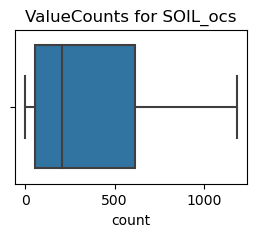

In [157]:
plt.figure(figsize=(3,2))
sns.boxplot(x=train_raw['SOIL_ocs_0.30cm_mean_0.01_deg'].value_counts())
plt.title('ValueCounts for SOIL_ocs')
plt.show()

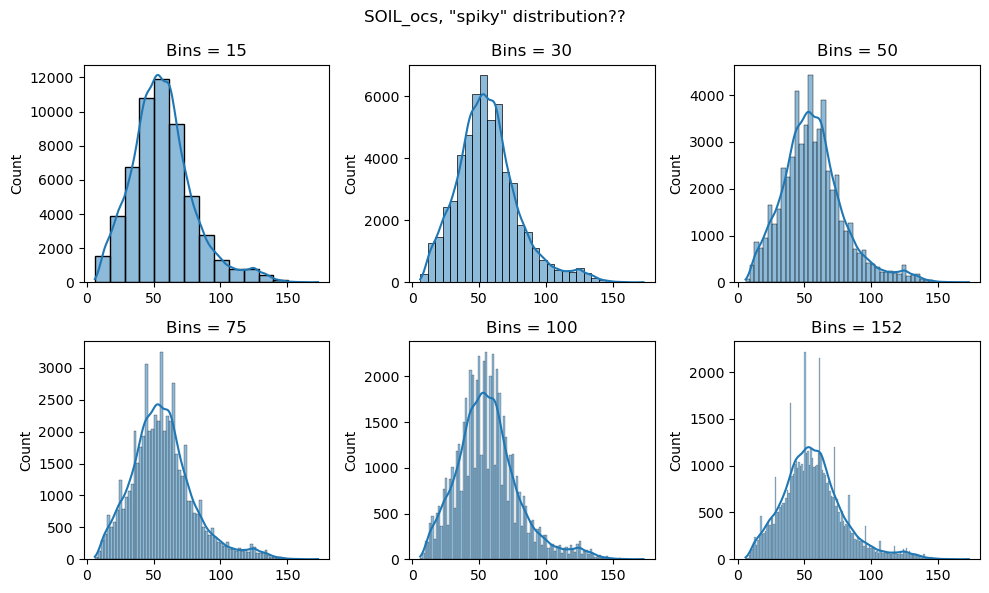

In [148]:
plt.figure(figsize=(10,6), tight_layout=True)
for i,bins in enumerate([15,30,50,75,100,
             train_raw['SOIL_ocs_0.30cm_mean_0.01_deg'].unique().shape[0]
            ]):
    ax=plt.subplot(2,3,i+1)
    sns.histplot(train_raw['SOIL_ocs_0.30cm_mean_0.01_deg'], kde=True, bins=bins, ax=ax)
    plt.title(f'Bins = {bins}')
    plt.xlabel('')
plt.suptitle('SOIL_ocs, "spiky" distribution??')
plt.show()

---

In [4]:
soil_list = list(set([f[1] for f in f_groups['SOIL'].str.split('_')]))

In [5]:
soil_list

['bdod',
 'cec',
 'ocs',
 'sand',
 'soc',
 'nitrogen',
 'cfvo',
 'clay',
 'phh2o',
 'ocd',
 'silt']

**Soil Measurements**<br><br>
*Carbon Content*: `ocs=`total organic carbon stock, `soc=`soil organic carbon,  `ocd=`organic carbon density, <br>
*Other*: `bdod=`bulk density?, `cec=`cation exchange capacity, `cfvo=`???,<br>
  - inversely related
    - bdod *vs* ocs, soc, ocd
    - sand *vs* silt, clay
  - directly related
    - ocd, ocs, soc
    - nitrogen, soc
  - unrelated to most measurements
    - **cfvo**

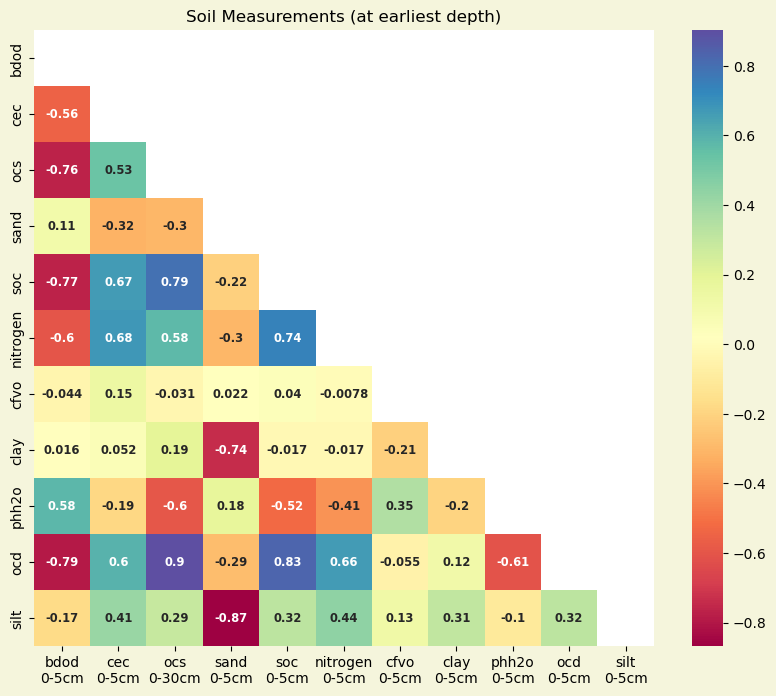

In [36]:
sub = pd.DataFrame()
for measurement in soil_list:
    cols = f_groups['SOIL'][f_groups['SOIL'].str.find(measurement)>0][0]
    sub = pd.concat([sub, train_raw[cols]], axis=1)

corr = sub.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10,8), facecolor='beige')
sns.heatmap(corr, mask=mask,
            cmap='Spectral', annot=True,
            annot_kws={'fontweight':'bold', 'fontsize':'small'}, 
            xticklabels=['\n'.join(f.split('_')[1:3]).replace('.','-') for f in sub.columns],
            yticklabels=[f.split('_')[1] for f in sub.columns])
plt.title(f'Soil Measurements (at earliest depth)')
plt.show()

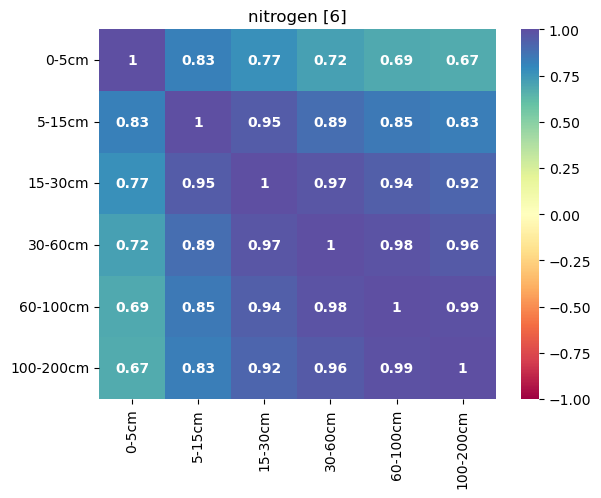

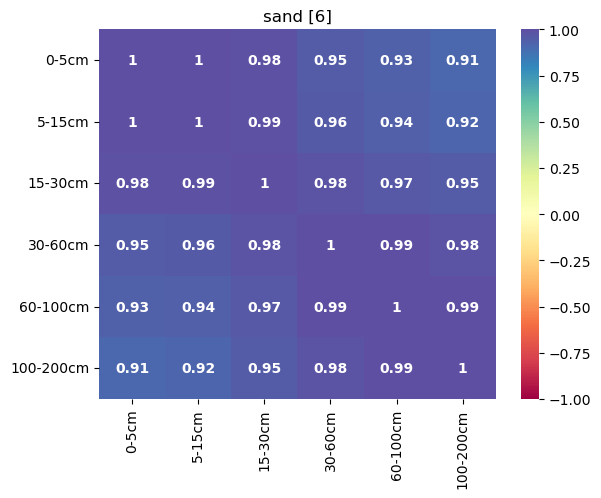

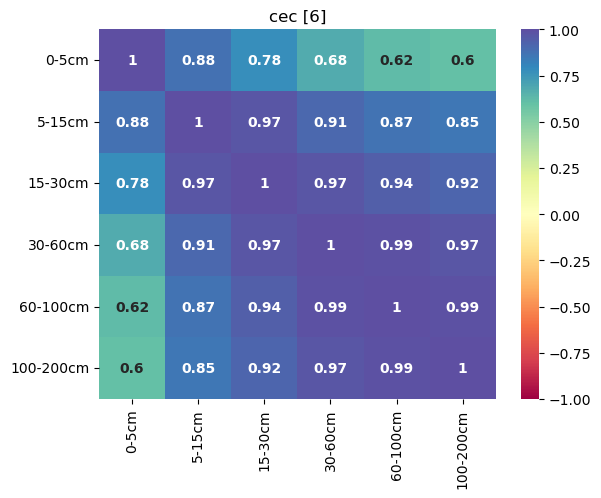

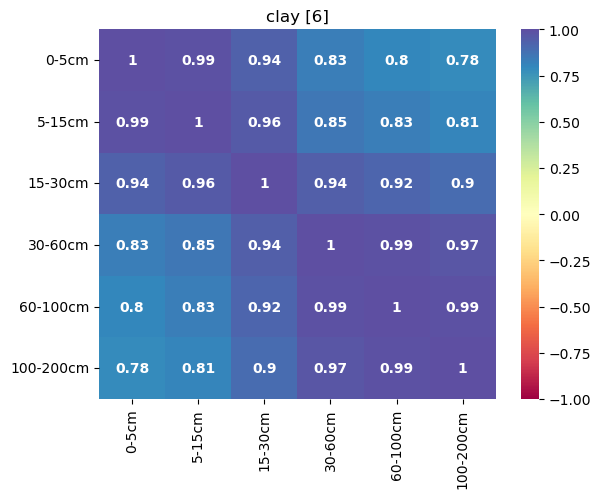

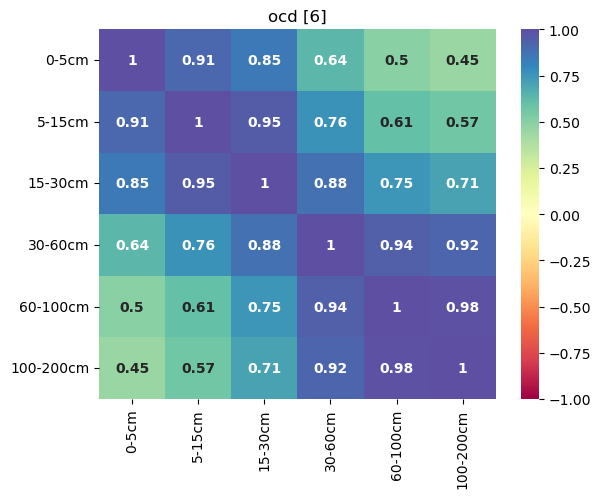

...

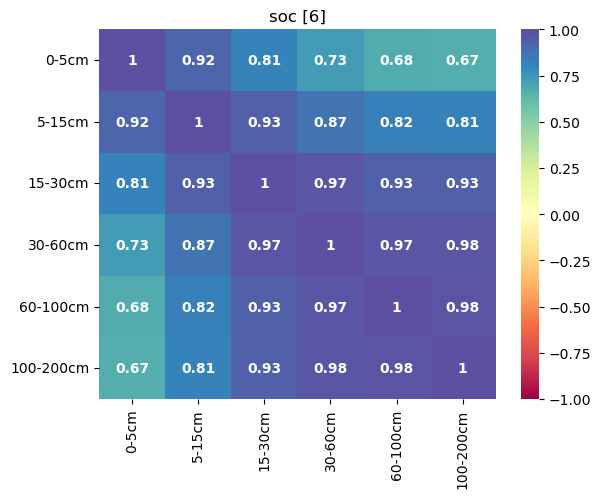

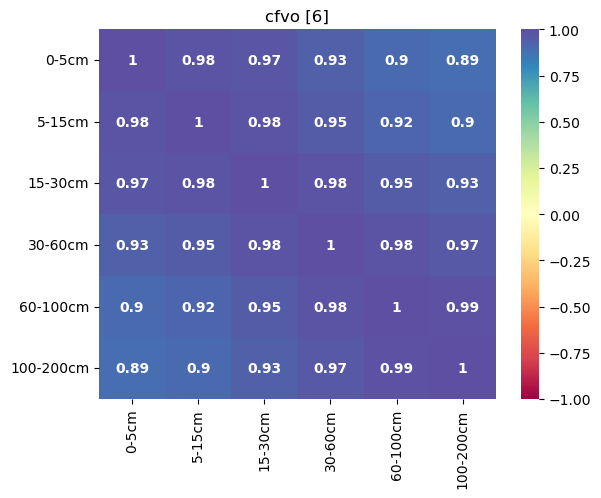

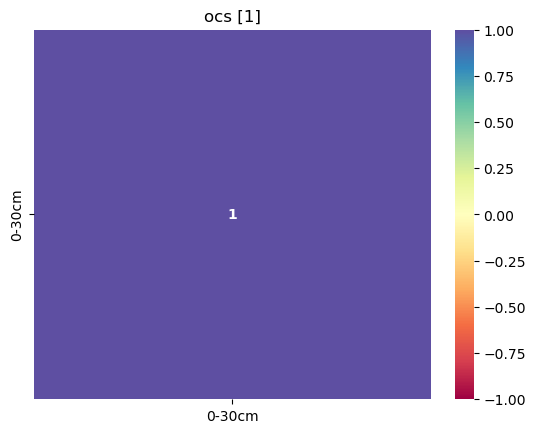

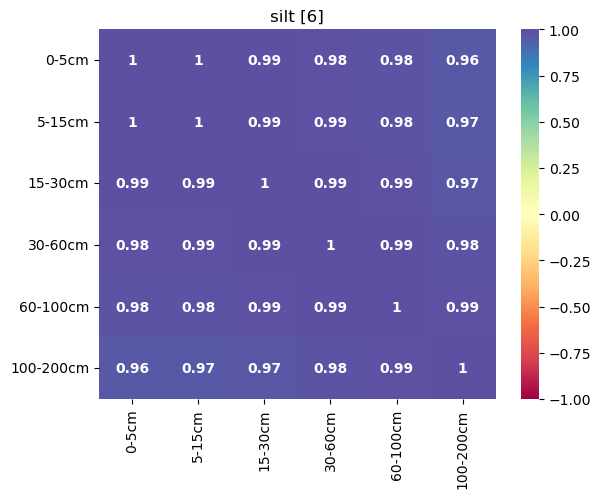

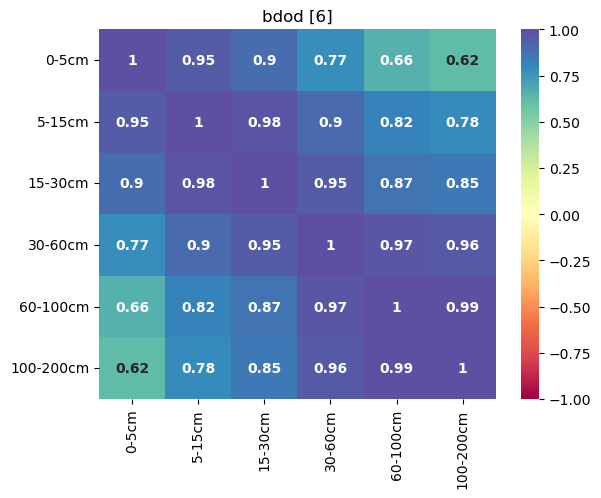

In [112]:
for measurement in soil_list:
    cols = f_groups['SOIL'][f_groups['SOIL'].str.find(measurement)>0]
    sub = train_raw[cols]
    
    # reorder columns for depth
    if cols.shape[0]>1:
        # extract lower bound for measurement and column position
        x = {i:int(f[2].split('.')[0]) for i,f in enumerate(sub.columns.str.split('_'))}
        x = dict(sorted(x.items(), key=lambda item: item[1]))
        sub = sub[[sub.columns[i] for i in x.keys()]]
    # correlation heatmap
    # plt.figure(figsize=(4,6), tight_layout=True)
    sns.heatmap(sub.corr(),
            cmap='Spectral', vmin=-1, annot=True,
            annot_kws={'fontweight':'bold'}, 
            yticklabels=[f.split('_')[2].replace('.','-') for f in sub.columns],
            xticklabels=[f.split('_')[2].replace('.','-') for f in sub.columns])
    plt.title(f'{measurement} [{cols.shape[0]}]')
    plt.show()

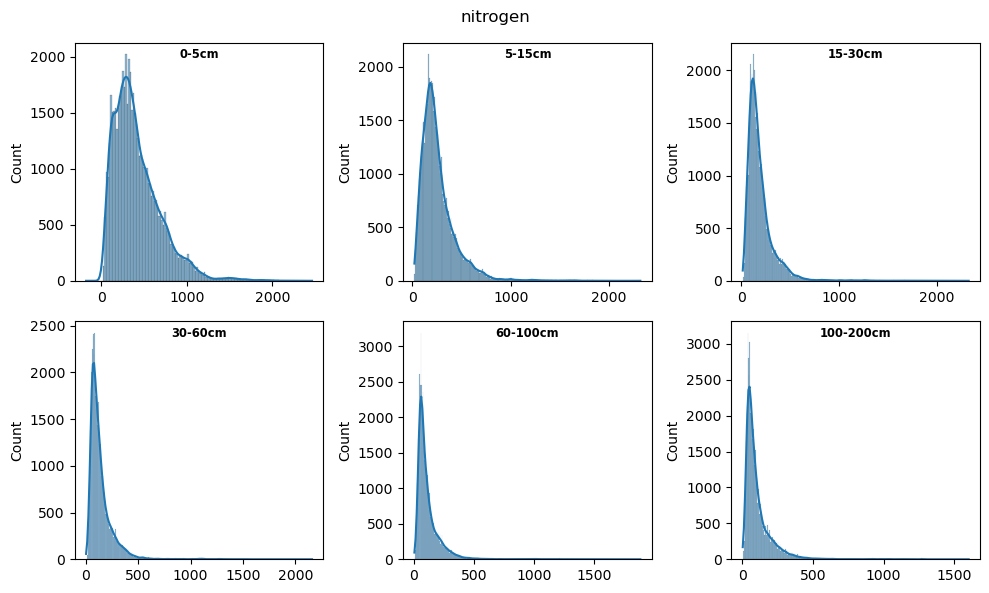

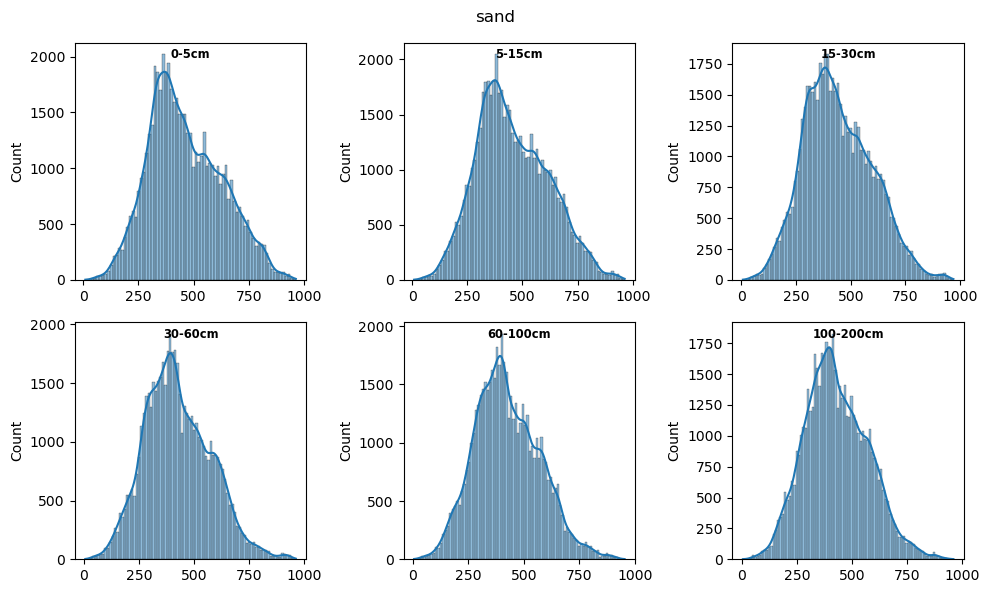

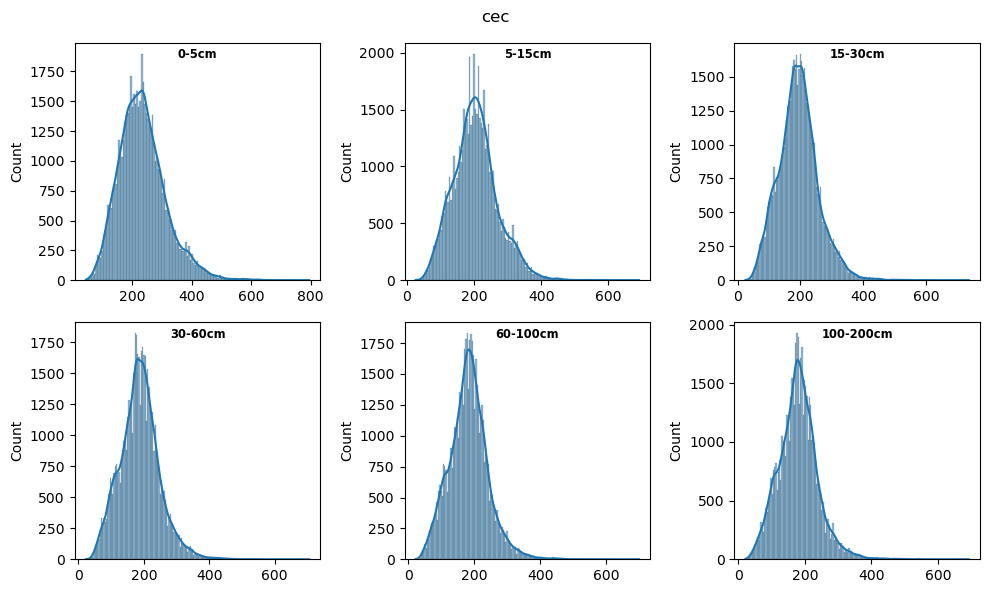

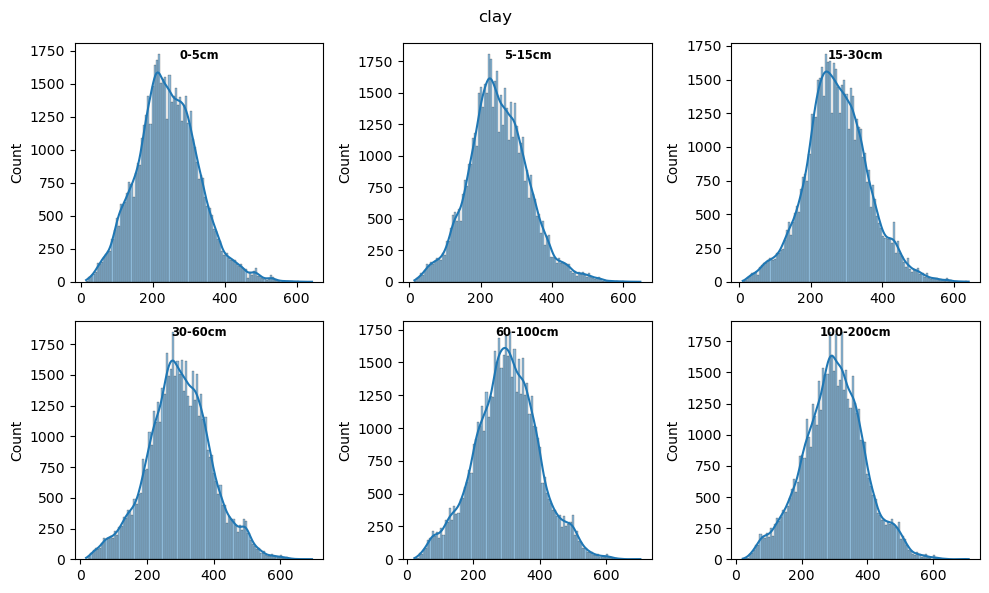

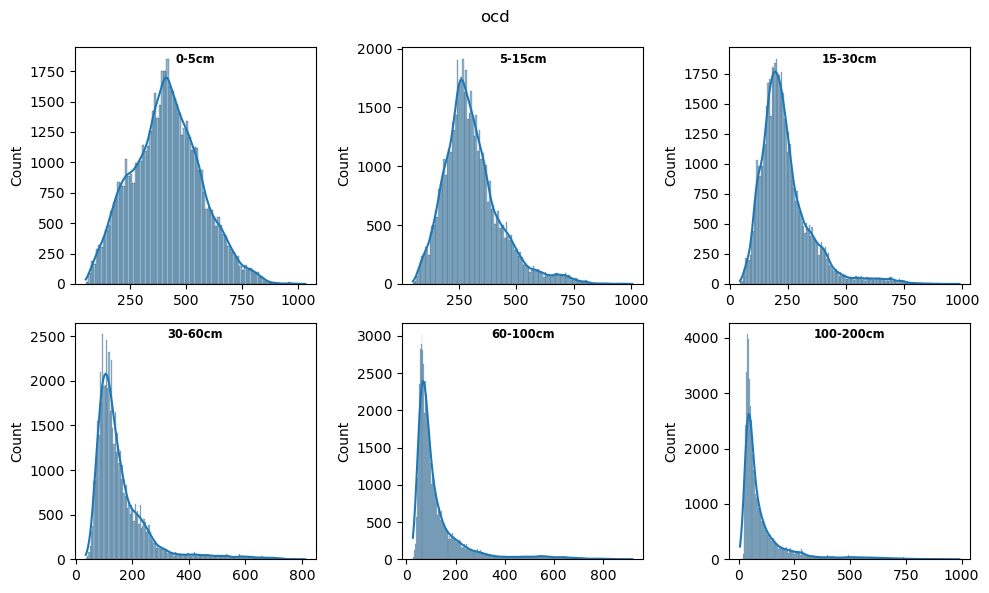

...

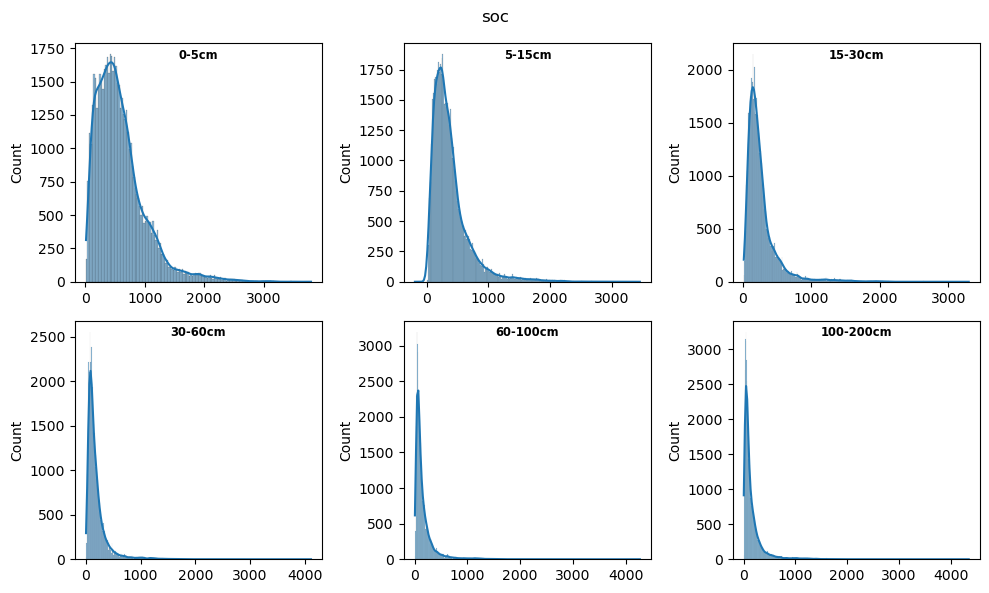

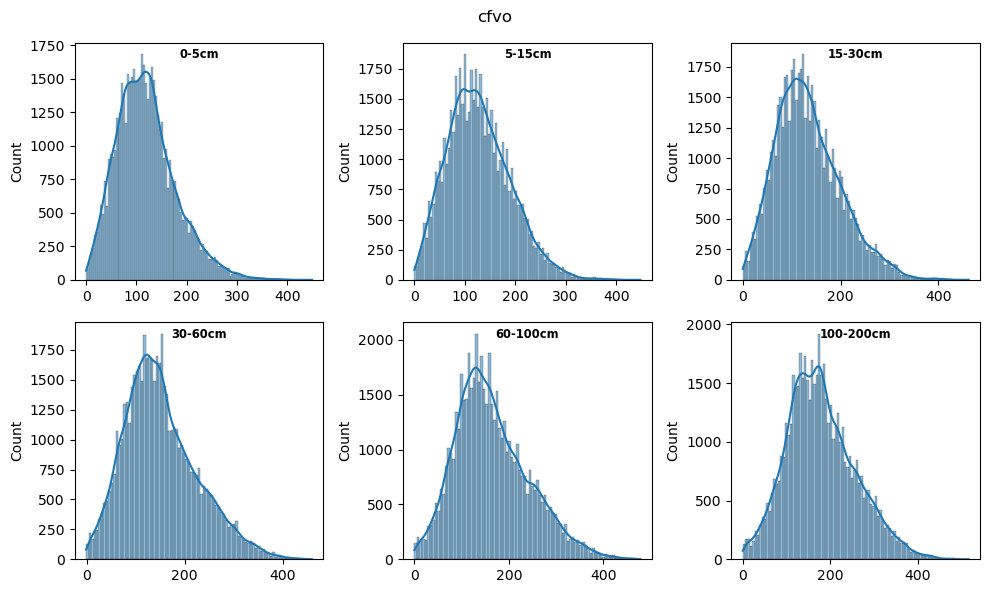

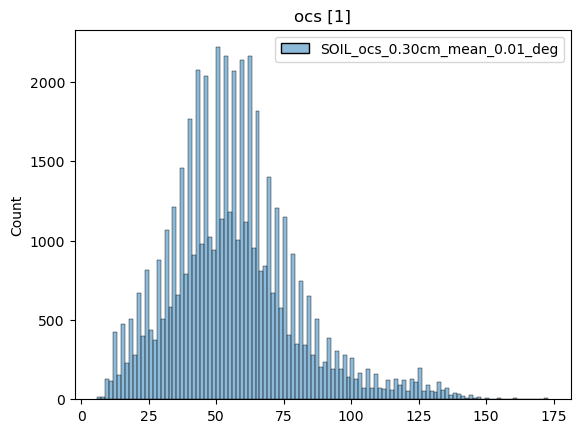

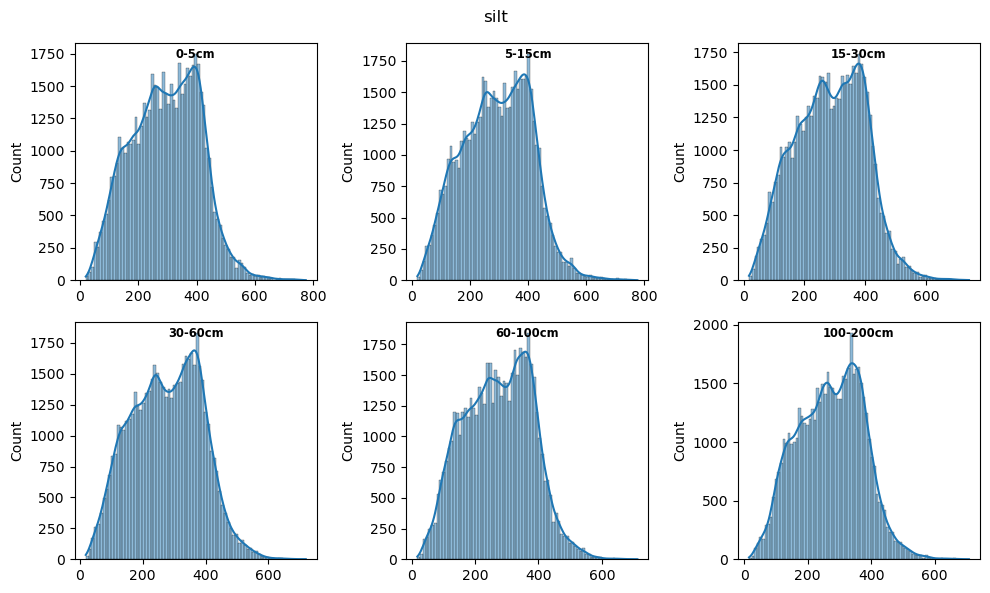

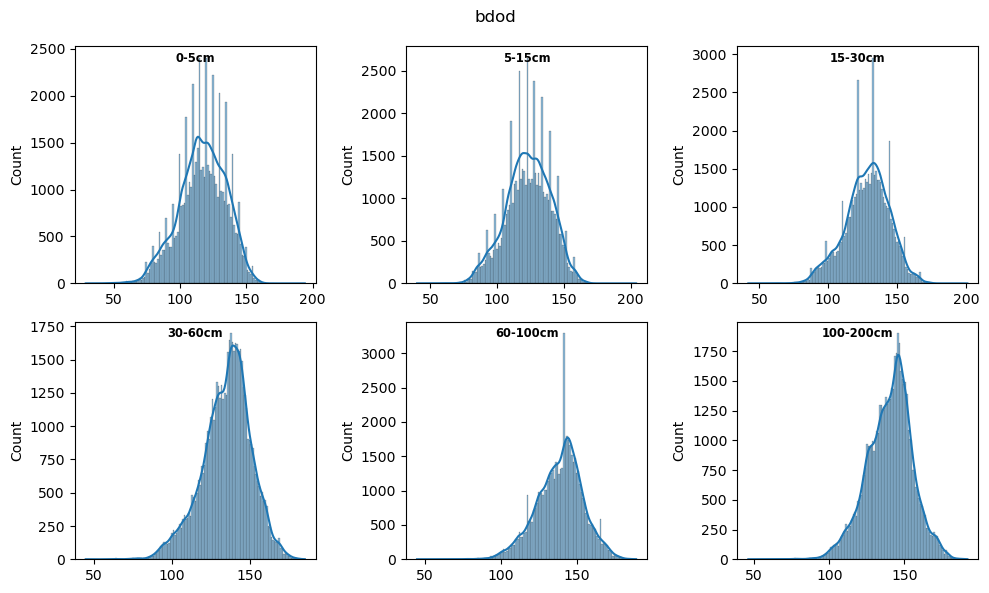

In [123]:
for measurement in soil_list:
    cols = f_groups['SOIL'][f_groups['SOIL'].str.find(measurement)>0]
    sub = train_raw[cols]
    
    # reorder columns for depth
    if cols.shape[0]>1:
        plt.figure(figsize=(10,6), tight_layout=True)
        # extract lower bound for measurement and column position
        x = {i:int(f[2].split('.')[0]) for i,f in enumerate(sub.columns.str.split('_'))}
        x = dict(sorted(x.items(), key=lambda item: item[1]))
        sub = sub[[sub.columns[i] for i in x.keys()]]
        for i,f in enumerate(sub.columns):
            ax = plt.subplot(2,3,i+1,)
            sns.histplot(train_raw[f], kde=True, ax=ax)
            plt.xlabel('')
            plt.title(f.split('_')[2].replace('.','-'),
                      fontsize='small', fontweight='bold', y=0.9)
        plt.suptitle(measurement, fontweight='bold')
    else:
        sns.histplot(sub)
        plt.xlabel('')
        plt.title(f'{measurement} [{cols.shape[0]}]')
    plt.show()

#### Climate Features
  - [WORLDCLIM definitions](https://www.worldclim.org/data/bioclim.html)
    - precipitation seasonality described as coefficient of variation, temperature used 100xSD (CofV calculation should only be used for measurements with a meaningful zero *ratio* vs *interval* scale)
      - ANUCLIM converts temperature to Kelvin
    - > This scheme follows that of ANUCLIM, except that for temperature seasonality the standard deviation was used because a coefficient of variation does not make sense with temperatures between -1 and 1).
    - [ANUCLIM61](https://fennerschool.anu.edu.au/files/anuclim61.pdf) see Chapter 6 (p74, 79/90)
      - > [bio15 is used to calculate precipitation seasonality, which is the standard deviation of weekly or monthly precipitation values as a percentage of the mean of those values](https://rdrr.io/github/ilyamaclean/climvars/man/bio15.html)
      - > The temperature Coefficient of Variation (C of V) is the standard deviation of the weekly mean temperatures expressed as a percentage of the mean of those temperatures. For this calculation, the mean in degrees Kelvin is used. This avoids the possibility o f having to divide by zero, but it does mean that the values are usually quite small. 
  - related features
    - the third feature (*delta_precipitation*) is defined by the difference in "BIO13" and "BIO14" from the ancillary geodata, the paper fount it more useful than either of the components
    - higher mean temperatures imply less seasonality and range
      - accordingly seasonality and range are closely related
    - precipitation most correlated with delta between wettest and dryest month, implying that it is not consistent
 - distributions
   - seem fine, some more skewed than others
   - high precipitation and delta precipitation values should be checked later
 - decomposition (PCA)
   - perform after standard scaling, otherwise temperature undervalued
   - **2-3 components captures most of variation and contains relatively equal contributions of the climate features**

In [32]:
f_groups['CLIM']

Index(['WORLDCLIM_BIO1_annual_mean_temperature',
       'WORLDCLIM_BIO12_annual_precipitation',
       'WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month',
       'WORLDCLIM_BIO15_precipitation_seasonality',
       'WORLDCLIM_BIO4_temperature_seasonality',
       'WORLDCLIM_BIO7_temperature_annual_range'],
      dtype='object')

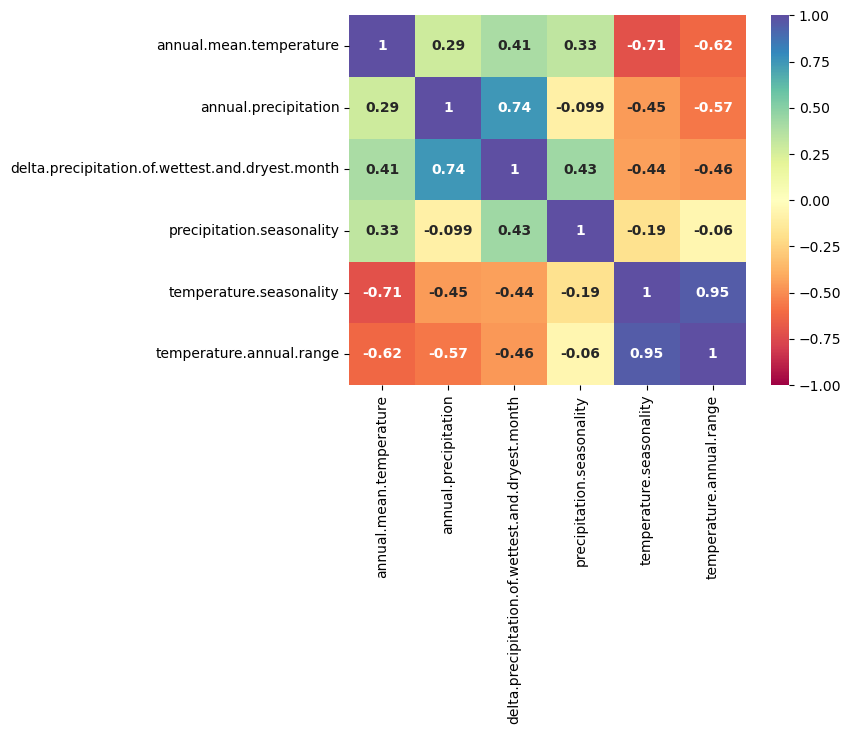

In [31]:
sns.heatmap(train_raw[f_groups['CLIM']].corr(),
            cmap='Spectral', vmin=-1, annot=True,
            annot_kws={'fontweight':'bold'}, 
            yticklabels=['.'.join(f.split('_')[2:]) for f in f_groups['CLIM']],
            xticklabels=['.'.join(f.split('_')[2:]) for f in f_groups['CLIM']])
plt.show()

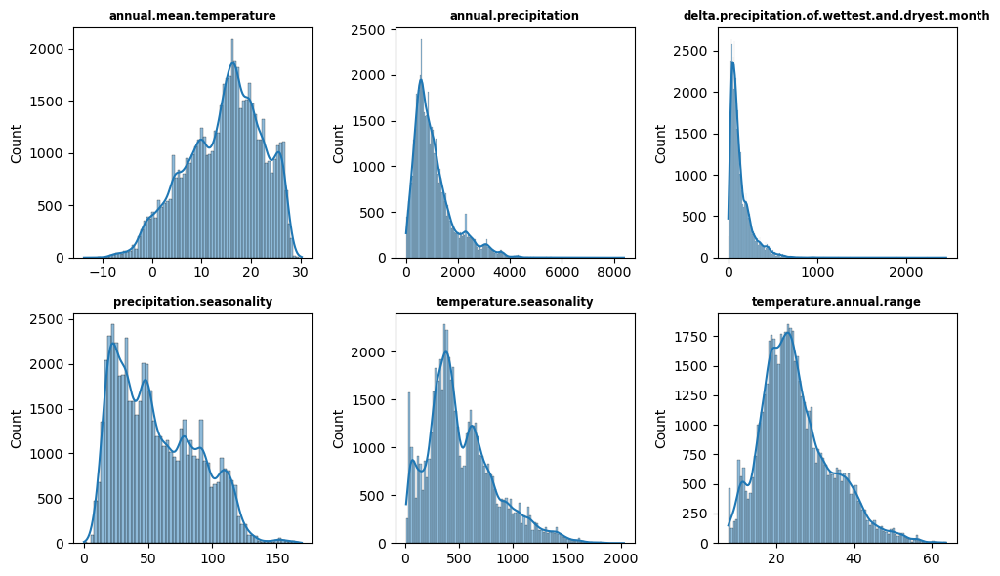

In [106]:
plt.figure(figsize=(10,6), tight_layout=True)
for i,f in enumerate(f_groups['CLIM']):
    ax = plt.subplot(2,3,i+1,)
    sns.histplot(train_raw[f], kde=True, ax=ax)
    plt.xlabel('')
    plt.title('.'.join(f.split('_')[2:]),
              fontsize='small', fontweight='bold')
plt.show()

In [221]:
f_groups['CLIM']

Index(['WORLDCLIM_BIO1_annual_mean_temperature',
       'WORLDCLIM_BIO12_annual_precipitation',
       'WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month',
       'WORLDCLIM_BIO15_precipitation_seasonality',
       'WORLDCLIM_BIO4_temperature_seasonality',
       'WORLDCLIM_BIO7_temperature_annual_range'],
      dtype='object')

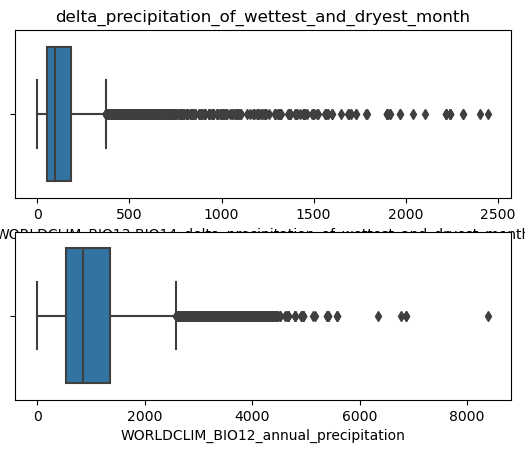

In [239]:
plt.subplot(211)
sns.boxplot(x = train_raw['WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month'])
#plt.title('delta_precipitation_of_wettest_and_dryest_month')
plt.title('delta_precipitation_of_wettest_and_dryest_month')

plt.subplot(212)
sns.boxplot(x = train_raw['WORLDCLIM_BIO12_annual_precipitation'])
plt.show()

In [226]:
train_raw[train_raw['WORLDCLIM_BIO12_annual_precipitation']<100]

,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,...,X18_mean,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd
id,,,,,,,,,,,,,,,,,,,,,
195542235,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,143,...,0.389315,0.642940,1.353468,574.098472,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477
122544125,16.022421,51.528572,9.942857,69.216621,650.196411,28.080477,134,143,137,141,...,1.723569,15.455128,2.173614,5346.520786,0.005584,0.252228,0.075072,2.401850,0.043489,79.995856
83282313,19.926935,35.392857,4.000000,35.118000,297.814880,21.632143,121,137,126,133,...,0.483366,0.073648,1.831999,632.546614,NaN,NaN,NaN,NaN,NaN,NaN
195317871,14.615873,29.042856,9.066667,101.108109,274.916138,17.687141,132,146,139,143,...,0.620750,2.097746,2.017486,1377.300487,NaN,NaN,NaN,NaN,NaN,NaN
194331498,18.264305,26.500000,8.133333,79.952415,257.233734,14.416191,127,143,134,142,...,0.915679,10.111726,2.046486,1584.378416,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195573136,17.419960,99.604759,12.671429,44.103996,862.910400,38.851429,137,151,146,147,...,0.892925,0.582744,1.287165,317.669186,NaN,NaN,NaN,NaN,NaN,NaN
191138274,17.471874,46.000000,4.250000,29.988190,223.124023,18.775000,134,145,136,141,...,0.622475,22.146200,2.459846,469.350977,NaN,NaN,NaN,NaN,NaN,NaN
141457829,13.311160,97.928574,30.285715,117.792557,316.085663,19.364286,132,149,142,147,...,1.188582,10.665893,2.656608,23473.464540,0.005799,0.412516,0.083669,1.700844,0.090581,904.884194


---
PCA

In [386]:
pca = PCA(n_components=6)
pca.fit(StandardScaler().fit_transform(train_raw[f_groups['CLIM']]))
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.cumsum())

[0.55857232 0.19611204 0.16712402 0.05774748 0.01497818 0.00546596]
[0.55857232 0.75468436 0.92180839 0.97955587 0.99453404 1.        ]


In [387]:
df = pd.DataFrame(pca.components_, columns=f_groups['CLIM'], 
             index=[f'PCA_{i+1}' for i in range(pca.components_.shape[0])]).T
round(df/df.abs().max(),3)

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6
WORLDCLIM_BIO1_annual_mean_temperature,0.856,0.265,-0.609,-1.000,-0.042,-0.134
WORLDCLIM_BIO12_annual_precipitation,0.790,-0.476,0.856,-0.171,-0.944,0.122
WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,0.846,0.166,1.000,-0.056,1.000,0.007
WORLDCLIM_BIO15_precipitation_seasonality,0.348,1.000,0.232,0.358,-0.586,-0.078
WORLDCLIM_BIO4_temperature_seasonality,-1.000,0.081,0.621,-0.408,-0.099,-1.000
WORLDCLIM_BIO7_temperature_annual_range,-0.995,0.260,0.463,-0.510,-0.043,0.965


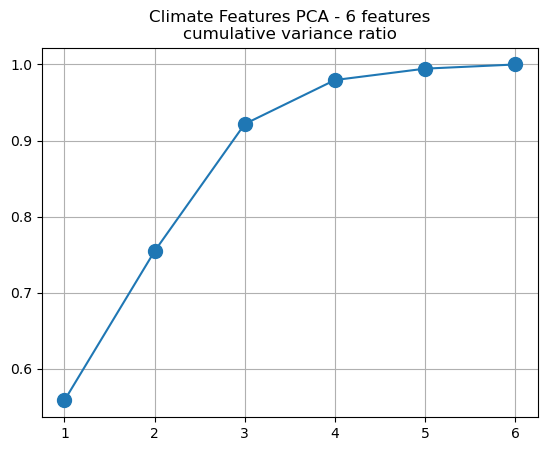

In [388]:
plt.plot(pca.explained_variance_ratio_.cumsum(), '.-', markersize=20)
xt = np.arange(pca.components_.shape[0])
plt.xticks(xt, xt+1)
plt.grid()
plt.title('Climate Features PCA - 6 features\ncumulative variance ratio')
plt.show()

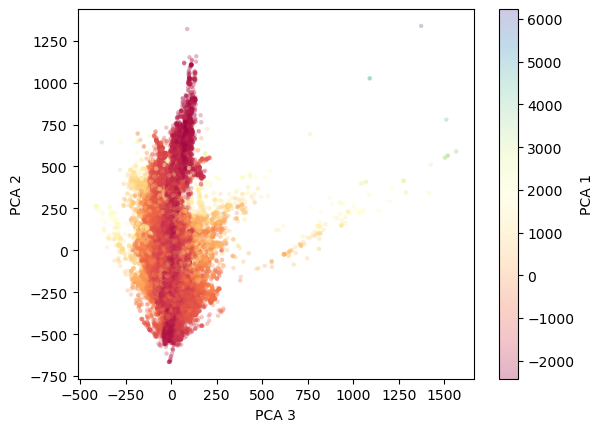

In [389]:
pca = PCA(n_components=3)
pca.fit(train_raw[f_groups['CLIM']])
red = pca.transform(train_raw[f_groups['CLIM']])
x = 2
y = 1
colorby = 0


plt.scatter(red[:,x], red[:,y], alpha=0.3, c=red[:,colorby]+red[:,colorby].min(),
            s=10, edgecolors='none', cmap='Spectral')
plt.xlabel(f'PCA {x+1}')
plt.ylabel(f'PCA {y+1}')
plt.colorbar(label=f'PCA {colorby+1}')
plt.show()

---
**Target Correlations**
 - using outlier cleaned data from below

In [7]:
X

NameError: name 'X' is not defined

### Targets Exploration
 - competition background *see [below](#Outlier-Cleaning-Start) for details*
   - in previous competition work my target treatment method was as follows:
     - "investigative clean"
     - "paper" clean on remaining samples
     - `box-cox` [power transformation](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html#sklearn.preprocessing.PowerTransformer)
       - values must be positive, otherwise use `yeo-johnson`
       - tried log transformation, yeo-johnson, and box-cox. found box-cox to be best for competition.
   - **TRANSFORMATIONS**
     - difficult to inverse transform with symbolic tensors, therefore training history of tensorflow models use transformed target values, and care must be taken in their interpretation.
 - targets
   - varied range and distribution for each target, `X4` is the smallest in magnitude and the only to contain negative values
     - negative values do make sense for a density measurement
   - distributions vs cleaning methods shown [below](#Outlier-Cleaning-Start) 

In [2]:
descriptions = {}

for i,description in enumerate(['Stem/wood density','Leaf area per mass',
                                'Height', 'Seed dry mass',
                                'Leaf nitrogen per area', 'Leaf area']):
    descriptions[targets[i]] = description

In [9]:
train_raw[targets].describe()

,X4_mean,X11_mean,X18_mean,X26_mean,X50_mean,X3112_mean
count,55489.000000,5.548900e+04,5.548900e+04,5.548900e+04,55489.000000,5.548900e+04
mean,0.522575,1.325267e+02,1.969902e+04,3.459399e+03,13.528574,3.975552e+05
std,0.174853,1.278220e+04,2.309747e+06,2.471919e+05,1356.480785,9.152463e+07
min,-2.431157,6.780000e-05,2.330000e-08,5.500000e-07,0.000097,7.690000e-08
25%,0.410995,1.063987e+01,3.102831e-01,5.613414e-01,1.173489,2.552815e+02
50%,0.509009,1.511232e+01,7.156651e-01,2.519985e+00,1.480060,7.244318e+02
75%,0.622383,1.968160e+01,3.586311e+00,1.491886e+01,1.926343,2.148630e+03
max,4.475172,1.504254e+06,2.720494e+08,3.106555e+07,159759.897700,2.155911e+10


In [31]:
features.shape

(163,)

#### Outlier Cleaning Start
 - my previous work on the project indicated that none of these may be aggressive enough. however the competition updated its test dataset multiple times. my cleaning may have been appropriate, and then the subsequent models failed to predict leftover outliers in the test set. I will show my old approach for visualizations, then make a final determination to for cutoffs to use for this project (which will only use the training data from the competition).
   - "investigate" = manual outlier identification, image checks
   - "standard", "aggressive" = boundaries for previous based on distribution checks.
   - "[paper]" = method described by authors, log-transform then remove outliers based on 3 SDs
     - good for normalizing traits <<1 and >>1, but different dataset
   - "manual" AKA "investigative" = raw values based on guesses and looking at the training images
     - detailed above
---
**Graph Notes**
  - methods
    - "paper" clean tends to be the most stringent, but are too many real values being removed?
  - `X4` looks to be the most normal on its own, but cleaning still helps. did not consider how to make negative values realistic (`abs`?), and therefore removed.
  - `X11`, `X18` SD based are not sufficient without a transformation first, proper cleaning probably somewhere in between "investigative" and "paper"
  - `X26` all cleaning except "paper" look similar (not enough!). cutoff should be closer to "paper"
  - `X50` "standard" clean way too open, "paper" clean could be way too stringent? do values outside of the main distribution make sense?
  - `X3112` only "investigative" and "paper" clean are good starts

In [3]:
    # raw maximums: 4.48 | 1.5e6 | 2.7e8 | 3.1e7 | 1.6e5 | 2.2e10
outlier_cleaning= {
    'standard': { # 33 removed
        'X4_mean': ('raw', 15), # X4 --> 2.62
        'X11_mean': ('log', 15), # X11 --> 2.7e4
        'X18_mean': ('raw', 10), # X18 --> 1.4e5
        'X26_mean': ('raw', 15), # X26 --> 2.4e4
        'X50_mean': ('raw', 25), # X50 --> 459
        'X3112_mean': ('log', 10), # X3112 --> 3.2e6
    },
    'aggressive': { # 77 removed
        'X4_mean': ('raw', 10), # X4 --> 2.04
        'X11_mean': ('raw', 10), # X11 --> 1.4e3
        'X18_mean': ('log', 5), # X18 --> 3.1e3
        'X26_mean': ('log', 5), # X26 --> 2.4e4 | log, 3 reduces to 5.5e3, 219 removed
        'X50_mean': ('log', 10), # X50 --> 55.6
        'X3112_mean': ('log', 5), # X3112    -->  1.7e6    
    },
    'paper': { # 987 removed
        'X4_mean': ('log', 3), # X4 --> 2.04
        'X11_mean': ('log', 3), # X11 --> 1.4e3
        'X18_mean': ('log', 3), # X18 --> 3.1e3
        'X26_mean': ('log', 3), # X26 --> 2.4e4 | log, 3 reduces to 5.5e3, 219 removed
        'X50_mean': ('log', 3), # X50 --> 55.6
        'X3112_mean': ('log', 3), # X3112    -->  1.7e6    
    },
    'manual': {
        'X4_mean': (0,4), # X4 --> good
        'X11_mean': (0, 300), # X11 --> reduce to 200?, 250? 
        'X18_mean': (0, 150), # X18 --> good
        'X26_mean': (0, 3e4), # X26 --> fine?
        'X50_mean': (0, 50), # X50 --> reduce to 20?
        'X3112_mean': (0, 5.5e5), # X3112 --> reduce to 1e5? 2e5?  
    },
}

In [4]:
def outlier_clean(data, cleaning, targets):
    train = data.copy()
    
    # remove negative X4
    neg_X4 = train[train[targets[0]]<=0].shape[0]
    train = train[train[targets[0]]>0]
    
    # remove outliers per specification
    # record detected for each column, as there will be overlap
    detected = {}
    outlier_ind = []
    for col, thresh in cleaning.items():
        if type(thresh[0]) == str:
            # SD based cleaning, with raw or log10 transformed values
            if thresh[0] == 'log':
                out_bounds = np.log(train[col]).mean()-thresh[1]*np.log(train[col]).std(),\
                             np.log(train[col]).mean()+thresh[1]*np.log(train[col]).std()
                outs = train[np.log(train[col]).between(out_bounds[0],out_bounds[1])==False].index.values
            else: 
                out_bounds = train[col].mean()-thresh[1]*train[col].std(),\
                             train[col].mean()+thresh[1]*train[col].std()
                outs = train[train[col].between(out_bounds[0],out_bounds[1])==False].index.values
        else:
            # Value based cleaning, use upper and lower bounds. All lower bounds==0, don't include.
            outs = train[train[col].between(thresh[0],thresh[1], inclusive='right')==False].index.values
        outlier_ind.extend(outs)
        detected[col] = len(outs)
        
    detected[targets[0]] = f'{detected[targets[0]]}, and {neg_X4}<0'
    outlier_ind = set(outlier_ind)
    train.drop(index=outlier_ind, inplace=True)
    
    return train, detected, f'{len(outlier_ind)}' #  (+{neg_X4})
            

In [51]:
# returns cleaned df, 
# number detected for each feature (X4 separates positive + negative
# total number of outliers detected (does not take into account negative X4)
# so total samples removed = "c" + X4 negatives
# a,b,c =  outlier_clean(train_raw, outlier_cleaning['paper'], targets)

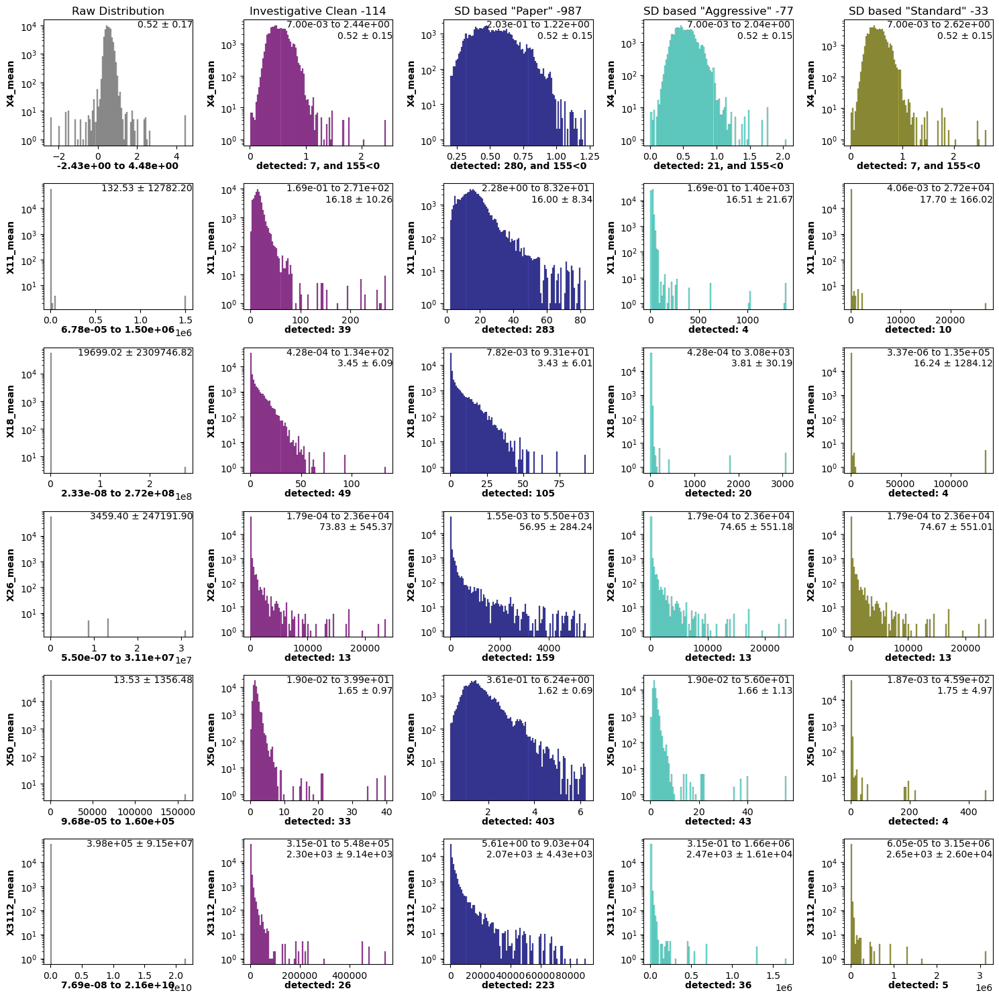

CPU times: total: 20.4 s
Wall time: 20.4 s


In [8]:
%%time

# Target outlier removal | specified raw/log SDs away from mean
fig, axs = plt.subplots(6, 5, figsize=(15, 15), tight_layout=True)

# Column 1: Raw
k=0
for i,t in enumerate(targets):
    sns.histplot(train_raw[t], bins=100, ax=axs[i,k], color='grey')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'{train_raw[t].min():.2e} to {train_raw[t].max():.2e}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{train_raw[t].mean():.2f} ± {train_raw[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{train_raw[t].mean():.2e} ± {train_raw[t].std():.2e}',
                      ha='right', va='top')        
    if i == 0:
        axs[i,k].set_title('Raw Distribution')

k+=1
# Column 2: Newest, thoroughest clean, "Investigative"
sub, detected, removed = outlier_clean(train_raw, outlier_cleaning['manual'], targets)
for i,t in enumerate(targets): 
    sns.histplot(sub[t], bins=100, ax=axs[i,k], color='purple')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'detected: {detected[t]}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2f} ± {sub[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2e} ± {sub[t].std():.2e}',
                      ha='right', va='top')        
    if i == 0:
        axs[i,k].set_title(f'Investigative Clean -{removed}')

k+=1
# Column 3: Paper clean, 3 SDs after log transformation
sub, detected, removed = outlier_clean(train_raw, outlier_cleaning['paper'], targets)
for i,t in enumerate(targets): 
    sns.histplot(sub[t], bins=100, ax=axs[i,k], color='darkblue')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'detected: {detected[t]}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2f} ± {sub[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2e} ± {sub[t].std():.2e}',
                      ha='right', va='top') 
    if i == 0:
        axs[i,k].set_title(f'SD based "Paper" -{removed}')

k+=1
# Column 4: Aggressive clean, various raw/log SD thresholds
sub, detected, removed = outlier_clean(train_raw, outlier_cleaning['aggressive'], targets)
for i,t in enumerate(targets): 
    sns.histplot(sub[t], bins=100, ax=axs[i,k], color='turquoise')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'detected: {detected[t]}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2f} ± {sub[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2e} ± {sub[t].std():.2e}',
                      ha='right', va='top') 
    if i == 0:
        axs[i,k].set_title(f'SD based "Aggressive" -{removed}')

k+=1
# Column 5: Standard clean, various raw/log SD thresholds
sub, detected, removed = outlier_clean(train_raw, outlier_cleaning['standard'], targets)
for i,t in enumerate(targets): 
    sns.histplot(sub[t], bins=100, ax=axs[i,k], color='olive')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'detected: {detected[t]}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2f} ± {sub[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2e} ± {sub[t].std():.2e}',
                      ha='right', va='top') 
    if i == 0:
        axs[i,k].set_title(f'SD based "Standard" -{removed}')
        
    
#plt.savefig(Path('Target Outlier Study', 'Graphs', 'clean_compare_all_targets.png'))
plt.show()

#### Images Investigation
 - `plant_plotter` function to plot images adapted from Kaggle user [michalinahulak's](https://www.kaggle.com/michalinahulak) [EDA notebook](https://www.kaggle.com/code/michalinahulak/eda-target)
 - plot a trait, determine upper bound extreme
   - should lower bounds be considered? only X4_mean has lower bound cutoff
 - investigations and findings (see filename) are saved in the repository, so this notebook can be kept relatively light for online viewing.
   - [folder](https://github.com/NBPub/Springboard/tree/main/Capstone%20Three/graphs/target%20outliers/Individual)
 - use `X3112` as an example: leaf area
   - after 5.5e5, images don't necessarily look like they are plants with big leaves
   - just under that value are some big trees and ferns
     - [quick search](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC10333482/) might support: ferns may not follow the same empirical rule of dimishing returns (leaf area scales with leaf dry mass) that angiospersm and gymnosperms do.
       - authors found interesting results at certain elevation ranges, but it would support high leaf mass per area, which is the inverse of `X11`
     - did a quick check of `X11` percentiles on high `X3112` plants, some fern looking plants had low values (around 5%) and ones with higher leaf area had high values (around 90%)
       - low values are palm/palmetto plants, high values might actually be ferns [resource](https://identify.plantnet.org/)

In [ ]:
    'manual': { # 114 removed
        'X4_mean': (0,4), # X4 --> good
        'X11_mean': (0, 300), # X11 --> reduce to 200?, 250? 
        'X18_mean': (0, 150), # X18 --> good
        'X26_mean': (0, 3e4), # X26 --> fine?
        'X50_mean': (0, 50), # X50 --> reduce to 20?
        'X3112_mean': (0, 5.5e5), # X3112 --> reduce to 1e5? 2e5?  
    },

In [ ]:
    'mod_manual': { # 987 removed
        'X4_mean': (0,2.5), # X4 --> good
        'X11_mean': (0, 750), # X11 --> 
        'X18_mean': (0, 100), # X18 -->
        'X26_mean': (0, 1e3), # X26 --> 
        'X50_mean': (0, 5), # X50 --> 
        'X3112_mean': (0, 1.5e4), # X3112 --> 
    },

In [48]:
def plant_plotter(indices, y, save_title=None, compare_trait=None):
    image_folder = Path('planttraits2024','train_images')
    num_cols = 5
    num_rows = (len(indices) - 1) // num_cols + 1    
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 20))
   
    for i, ind in enumerate(indices):
        img = Image.open(Path(image_folder, f'{ind}.jpeg'))
        ax = axs[i // num_cols, i % num_cols]
        ax.imshow(img)
        ax.axis('off')
        if compare_trait and compare_trait in targets:
            ax.set_title(f"ID: {ind} | {train_raw.loc[ind,y]:.2e}\n{compare_trait}: {stats.percentileofscore(train_raw[compare_trait], train_raw.loc[ind,compare_trait]):.1f}%")
        else:
            ax.set_title(f"ID: {ind} | {train_raw.loc[ind,y]:.2e}")
        for j in range(len(indices), num_rows*num_cols):
            axs.flatten()[j].set_visible(False)
    
    
    
    plt.suptitle(descriptions[y], y=0.98, fontsize='large')
    plt.tight_layout()
    if save_title and save_title!='':
        plt.savefig(Path('Outlier Pics', f'{y}_{save_title}.png', dpi=100))
    plt.show()

In [26]:
y = targets[5]

indices=train_raw[(train_raw[y].between(4e5,9e7))].sort_values(y).index

indices

Index([ 60379289,  62534505,  39541205, 105914512,  46179461, 118451368,
       192989017,  71392669, 196276207, 196305664, 193110639, 194099632,
       192913870, 195245185, 194091952, 193947065, 194951954, 191454934,
       195741089, 188814351, 190880155, 189853736, 192434918, 195452292,
       195675879, 195967587, 194948147, 149790098, 144501033, 182989395,
       161858482, 177608895, 146738066, 149408923, 132369205, 133823845,
       132128809, 178886778, 142562913, 194912853, 101425452,  18699941,
       128260887, 128786099,  91107970, 130625320, 195016760, 186688852,
       187965901, 187955133,  51276000,  10220965,  26805316,  98552902,
        26805315],
      dtype='int64', name='id')

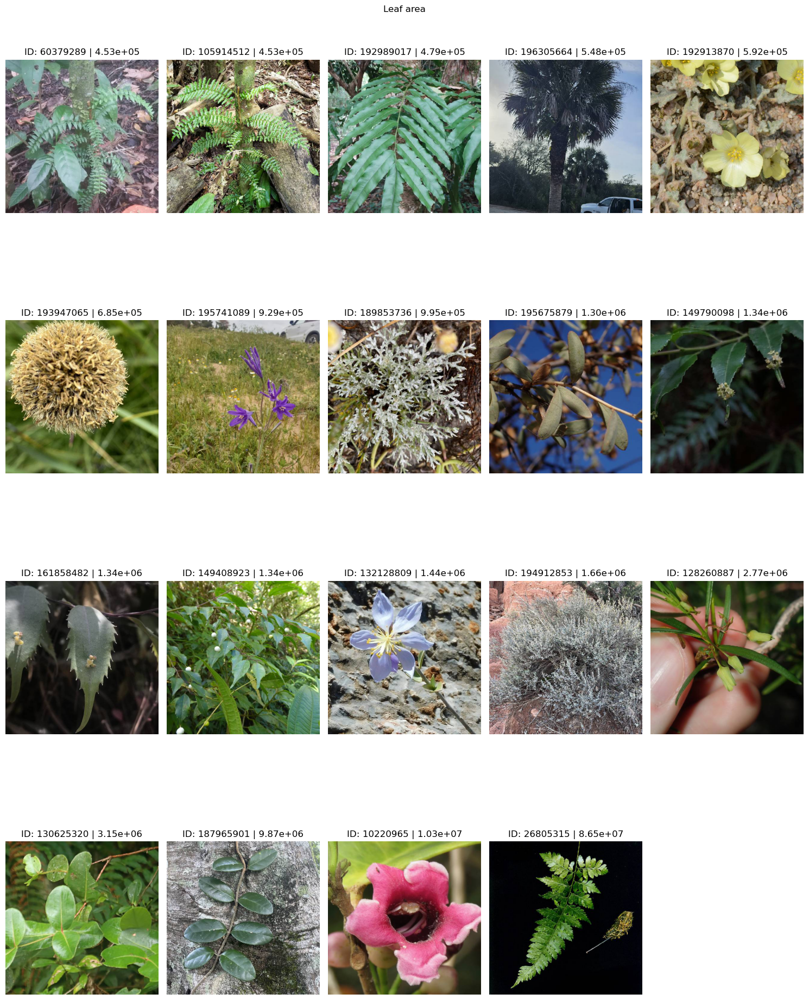

In [29]:
plant_plotter(indices[::3],y,) # leaf-nitrogen-per-area

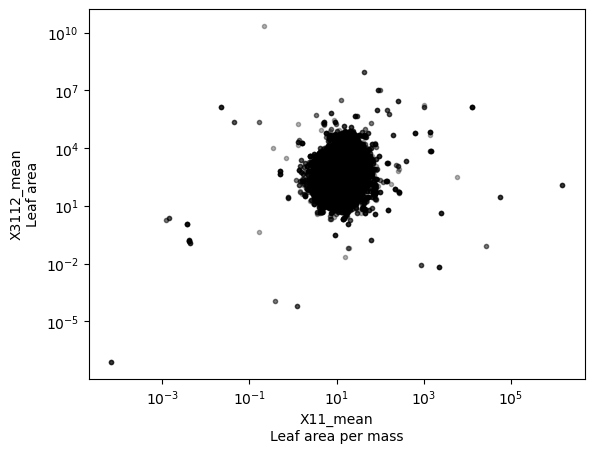

In [36]:
plt.plot(train_raw[targets[1]], train_raw[targets[5]], 'k.', alpha=0.3)
plt.xlabel(f'{targets[1]}\n{descriptions[targets[1]]}')
plt.xscale('log')
plt.ylabel(f'{targets[5]}\n{descriptions[targets[5]]}')
plt.yscale('log')
plt.show()

In [49]:
y = targets[5]
indices=train_raw[(train_raw[y].between(1.5e5,4.6e5))].sort_values(y).index
indices

Index([196456647, 196428468, 193417778, 191316291, 195725639, 195754121,
       195323129, 196075410, 195677317, 134283002, 185395717,  69747774,
        68705972,  97320944, 171865491,  99655060, 193576812, 194660600,
       194223873,  35522005, 131701253, 194645151, 195486483, 195411412,
       195416479, 194587876, 195544910, 105914512,  39541205,  60379289,
        46179461,  62534505],
      dtype='int64', name='id')

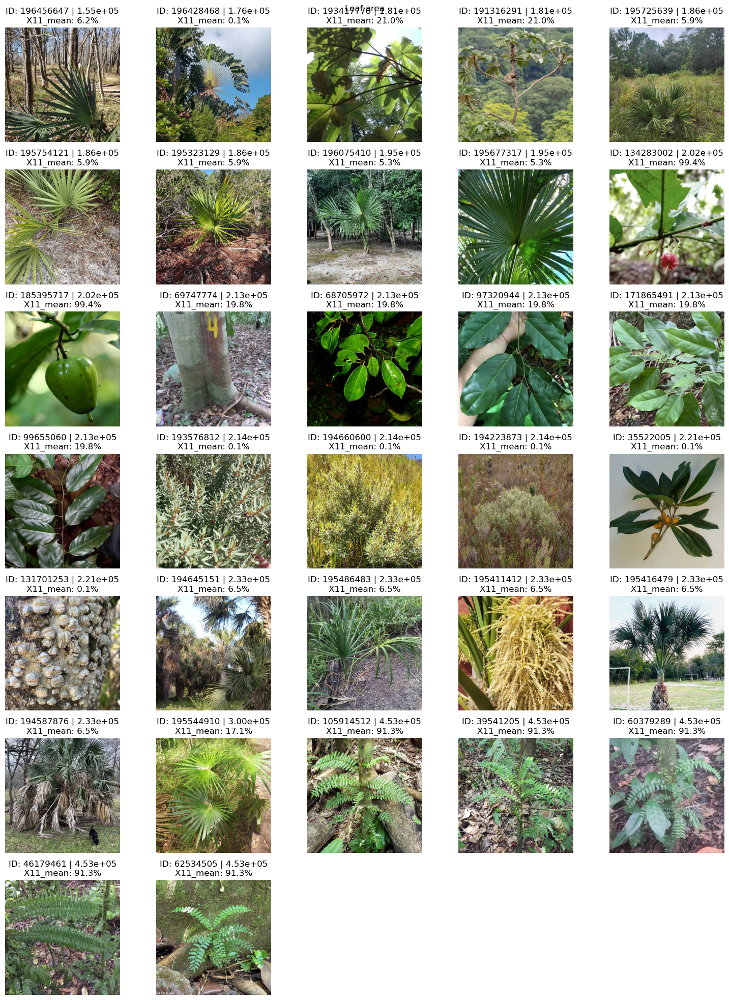

In [50]:
plant_plotter(indices,y, compare_trait=targets[1]) # leaf-nitrogen-per-area

### Pre Modeling Work
 - competition background
   - outlier resistant models worked well for geodata only. this was likely due to insufficient cleaning and should not be a problem with my internal project
   - LGBM, kNN, XGB, and ElasticNet models worked ok for geodata only. will start with ElasticNet here.
     - benefit of easy multi-output regression from [sklearn model](https://scikit-learn.org/stable/modules/linear_model.html#elastic-net)
     - also this applies to featurset 
       - > Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both
 - treat targets, features separately and investigate treatments
   - target work is focused on outlier investigation and removal
   - feature work is focused on decomposition (from the original 175)
 - targets
   - simple PCA for all features
   - use simple ElasticNet model or similar to evaluate a variety of cutoffs
     - not that dataset size and split will vary with each method, see target stratification graphs for each method
     - look for start of reasonable R2
   - nominate final method for modeling
 - features
   - simple PCA (as done for target study) or grouped PCA
     - grouped PCA will maintain feature groups and seek to decompose a set of related measurements.

#### Target Outlier Removal

In [5]:
def target_strat_check(targets, train_df, test_df, val_df=pd.DataFrame(), log_scaled=False,
                       title_addendum=''):
    plt.figure(figsize=(6,6), tight_layout=True, dpi=100)
    for i,col in enumerate(targets):
        plt.subplot(2,3,i+1)
        if val_df.empty:
            plt.boxplot([train_df[col], test_df[col]])
            ticks, labels = plt.xticks()
            plt.xticks(ticks=ticks, labels=['train','test'])
        else:
            plt.boxplot([train_df[col], test_df[col], val_df[col]])
            ticks, labels = plt.xticks()
            plt.xticks(ticks=ticks, labels=['train','test', 'val'])
        xb = plt.xlim()
        plt.plot(xb, (train_df[col].max(),)*2, 'r--')
        plt.plot(xb, (train_df[col].min(),)*2, 'r--')
        plt.plot(xb, (train_df[col].median(),)*2, 'y--', linewidth=0.5)
        plt.title(col)
        plt.grid(alpha=0.5)
        if i>0 and log_scaled==False:
            plt.yscale('log')
    
    plt.suptitle(f'Target Stratification Check{title_addendum}\n{train_df.shape[0]:.2e} | {test_df.shape[0]:.2e}')
    plt.show()
    return

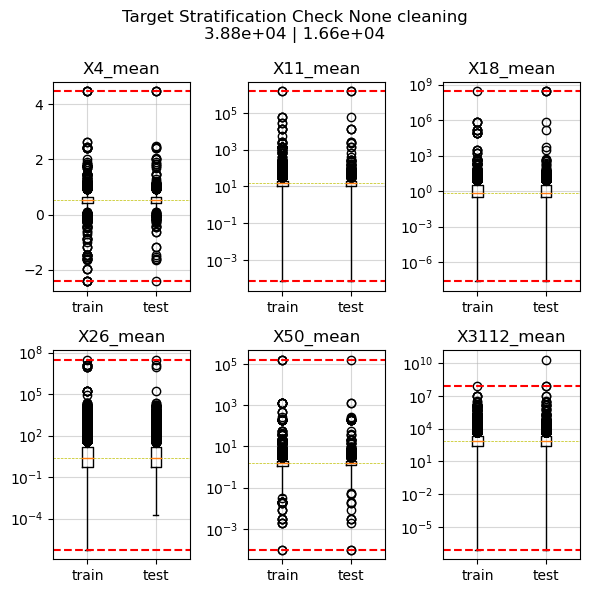

In [8]:
    data = train_raw.iloc[:,:-6]
        
    X = data[data.columns[~data.columns.isin(targets)]]
    y = data[targets]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    target_strat_check(targets, y_train,  y_test, title_addendum=f' {None} cleaning')

In [18]:
%%time

cv_results = pd.DataFrame()

for i,meth in tqdm(enumerate([None, 'standard', 'aggressive', 'manual', 'paper'])):
    # clean and gather data, remove SD columns
    if meth:
        data, _, _ = outlier_clean(train_raw, outlier_cleaning[meth], targets)
        data = data.iloc[:,:-6]
    else:
        data = train_raw.iloc[:,:-6]
        
    X = data[data.columns[~data.columns.isin(targets)]]
    y = data[targets]
    
    cv_results.loc[i,'cleaning'] = meth
    cv_results.loc[i,'samples'] = y.shape[0]
    
    # test/train split and stratification check
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    # target_strat_check(targets, y_train,  y_test, title_addendum=f' {meth} cleaning')
    
    # cross-validate elastic net, default 5-fold
    cv = cross_validate(ElasticNet(), X, y, n_jobs=-1,
scoring=['neg_mean_squared_error', 'neg_root_mean_squared_error', 
         'neg_root_mean_squared_log_error', 'neg_median_absolute_error', 'r2'])
    
    for key in cv.keys():
        if not key.startswith('test_'):
            continue
        cv_results.loc[i, key.replace('test_','')] = np.median(cv[key])

CPU times: total: 1.11 s
Wall time: 5min 58s


In [19]:
cv_results

,cleaning,samples,neg_mean_squared_error,neg_root_mean_squared_error,neg_root_mean_squared_log_error,neg_median_absolute_error,r2
0,NaN,55489.0,-5.334816e+12,-1.326313e+06,NaN,-471444.836381,-39.948951
1,standard,55301.0,-6.366766e+07,-3.550360e+03,NaN,-301.792130,-0.008518
2,aggressive,55257.0,-3.743530e+07,-2.615292e+03,NaN,-249.542886,0.042429
3,manual,55220.0,-1.467180e+07,-1.643276e+03,NaN,-218.661060,0.094471
4,paper,54347.0,-2.760190e+06,-7.267888e+02,NaN,-190.192894,0.128163


**Note trend of better error, R2 with more thorough cleaning**
 - will try my competition method: manual clean, then paper clean

In [27]:
%%time

meth = 'manual+paper'
i = 5

data, _, _ = outlier_clean(train_raw, outlier_cleaning['manual'], targets)
data, _, _ = outlier_clean(data, outlier_cleaning['paper'], targets)
data = data.iloc[:,:-6]

X = data[data.columns[~data.columns.isin(targets)]]
y = data[targets]

cv_results.loc[i,'cleaning'] = meth
cv_results.loc[i,'samples'] = y.shape[0]

cv = cross_validate(ElasticNet(), X, y, n_jobs=-1,
    scoring=['neg_mean_squared_error', 'neg_root_mean_squared_error', 
     'neg_root_mean_squared_log_error', 'neg_median_absolute_error', 'r2'])

for key in cv.keys():
    if not key.startswith('test_'):
        continue
    cv_results.loc[i, key.replace('test_','')] = np.median(cv[key])

CPU times: total: 406 ms
Wall time: 1min 9s


In [28]:
cv_results

,cleaning,samples,neg_mean_squared_error,neg_root_mean_squared_error,neg_root_mean_squared_log_error,neg_median_absolute_error,r2
0,NaN,55489.0,-5.334816e+12,-1.326313e+06,NaN,-471444.836381,-39.948951
1,standard,55301.0,-6.366766e+07,-3.550360e+03,NaN,-301.792130,-0.008518
2,aggressive,55257.0,-3.743530e+07,-2.615292e+03,NaN,-249.542886,0.042429
3,manual,55220.0,-1.467180e+07,-1.643276e+03,NaN,-218.661060,0.094471
4,paper,54347.0,-2.760190e+06,-7.267888e+02,NaN,-190.192894,0.128163
5,manual+paper,54034.0,-2.768819e+06,-7.279039e+02,NaN,-190.242215,0.130923


In [ ]:


for i,t in enumerate(targets): 
    sns.histplot(sub[t], bins=100, ax=axs[i,k], color='purple')
    axs[i,k].set_yscale('log')
    axs[i,k].set_ylabel(f'{t}', fontweight='bold')
    axs[i,k].set_xlabel(f'detected: {detected[t]}', labelpad=0, fontweight='bold')
    if i<5:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2f} ± {sub[t].std():.2f}',
                      ha='right', va='top')
    else:
        axs[i,k].text(axs[i,k].get_xlim()[1], axs[i,k].get_ylim()[1], 
f'{sub[t].min():.2e} to {sub[t].max():.2e} \n{sub[t].mean():.2e} ± {sub[t].std():.2e}',
                      ha='right', va='top')        
    if i == 0:
        axs[i,k].set_title(f'Investigative Clean -{removed}')

--- 
**Do again with PCA decomposition on features**
 - 30% features --> 49, 20% features --> 33
 - slightly worse performance, but much faster

In [43]:
%%time

cv_results = pd.DataFrame()

for i,meth in tqdm(enumerate([None, 'standard', 'aggressive', 'manual', 'paper'])): # 
    # clean and gather data, remove SD columns
    if meth:
        data, _, _ = outlier_clean(train_raw, outlier_cleaning[meth], targets)
        data = data.iloc[:,:-6]
    else:
        data = train_raw.iloc[:,:-6]
        
    X = data[data.columns[~data.columns.isin(targets)]]
    pca_X = PCA(49).fit_transform(X)
    y = data[targets]
    
    cv_results.loc[i,'cleaning'] = meth
    cv_results.loc[i,'samples'] = y.shape[0]
    
    # test/train split and stratification check
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    # target_strat_check(targets, y_train,  y_test, title_addendum=f' {meth} cleaning')
    
    # cross-validate elastic net, default 5-fold
    cv = cross_validate(ElasticNet(), pca_X, y, n_jobs=-1,
scoring=['neg_mean_squared_error', 'neg_root_mean_squared_error', 
         'neg_root_mean_squared_log_error', 'neg_median_absolute_error', 'r2'])
    
    for key in cv.keys():
        if not key.startswith('test_'):
            continue
        cv_results.loc[i, key.replace('test_','')] = np.median(cv[key])
        
        
meth = 'manual+paper'
i = 5

data, _, _ = outlier_clean(train_raw, outlier_cleaning['manual'], targets)
data, _, _ = outlier_clean(data, outlier_cleaning['paper'], targets)
data = data.iloc[:,:-6]

X = data[data.columns[~data.columns.isin(targets)]]
pca_X = PCA(49).fit_transform(X)
y = data[targets]

cv_results.loc[i,'cleaning'] = meth
cv_results.loc[i,'samples'] = y.shape[0]

cv = cross_validate(ElasticNet(), pca_X, y, n_jobs=-1,
    scoring=['neg_mean_squared_error', 'neg_root_mean_squared_error', 
     'neg_root_mean_squared_log_error', 'neg_median_absolute_error', 'r2'])

for key in cv.keys():
    if not key.startswith('test_'):
        continue
    cv_results.loc[i, key.replace('test_','')] = np.median(cv[key])

5it [00:07,  1.59s/it]


CPU times: total: 30 s
Wall time: 9.68 s


In [44]:
cv_results

,cleaning,samples,neg_mean_squared_error,neg_root_mean_squared_error,neg_root_mean_squared_log_error,neg_median_absolute_error,r2
0,NaN,55489.0,-2.886850e+12,-1.030263e+06,NaN,-277502.229817,-19.649799
1,standard,55301.0,-6.359045e+07,-3.548149e+03,NaN,-270.019717,0.009073
2,aggressive,55257.0,-3.743413e+07,-2.615368e+03,NaN,-243.536889,0.040836
3,manual,55220.0,-1.472702e+07,-1.646214e+03,NaN,-221.421902,0.089769
4,paper,54347.0,-2.784395e+06,-7.298451e+02,NaN,-193.552192,0.121921
5,manual+paper,54034.0,-2.794227e+06,-7.311064e+02,NaN,-193.067488,0.124342


#### Feature Grouping

In [8]:
# use best cleaning method for this study
data, _, _ = outlier_clean(train_raw, outlier_cleaning['manual'], targets)
data, _, _ = outlier_clean(data, outlier_cleaning['paper'], targets)
data = data.iloc[:,:-6]

X = data[data.columns[~data.columns.isin(targets)]]
y = data[targets]

X.shape, y.shape

((54034, 163), (54034, 6))

In [5]:
f_groups

NameError: name 'f_groups' is not defined